In [1]:
#diabetes


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [11]:
df = pd.read_csv('data\\diabetes.csv')

In [13]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [15]:
df.shape

(768, 9)

In [17]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [19]:
df.duplicated().sum()

0

In [21]:
df.isnull().sum()


Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [23]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [25]:
df.nunique()

Pregnancies                  17
Glucose                     136
BloodPressure                47
SkinThickness                51
Insulin                     186
BMI                         248
DiabetesPedigreeFunction    517
Age                          52
Outcome                       2
dtype: int64

In [29]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object type columns:")
print(object_columns)

Object type columns:
Index([], dtype='object')


In [31]:
numerical_columns = df.select_dtypes(include=['int64',
'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)


Numerical type columns:
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


In [54]:
def classify_features(df):
 categorical_features = []
 non_categorical_features = []
 discrete_features = []
 continuous_features = []
 for column in df.columns:
     if df[column].dtype == 'object':
         if df[column].nunique() < 20:
             categorical_features.append(column)
         else:
             non_categorical_features.append(column)
     elif df[column].dtype in ['int64', 'float64']:
        if df[column].nunique() < 10:
             discrete_features.append(column)
        else:
            continuous_features.append(column)
 return categorical_features, non_categorical_features,discrete_features, continuous_features,
categorical, non_categorical, discrete, continuous =classify_features(df)


In [56]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: []
Non-Categorical Features: []
Discrete Features: ['Outcome']
Continuous Features: ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']


In [58]:
df['Outcome'].unique()

array([1, 0], dtype=int64)

In [60]:
df['Outcome'].value_counts()

Outcome
0    500
1    268
Name: count, dtype: int64

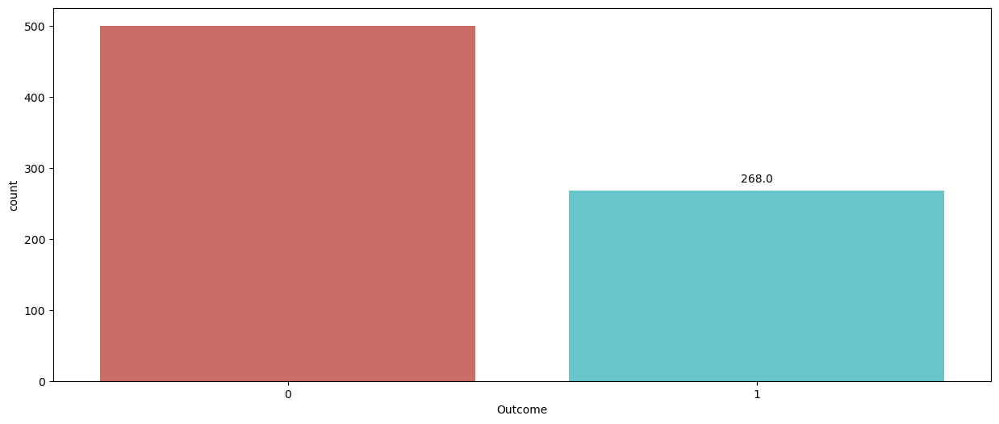

In [64]:
for i in discrete:
 plt.figure(figsize=(15, 6))
 ax = sns.countplot(x=i, data=df, palette='hls')
 for p in ax.patches:
     height = p.get_height()
 ax.annotate(f'{height}', 
     xy=(p.get_x() + p.get_width() / 2., height),
 xytext=(0, 10),
 textcoords='offset points',
 ha='center', va='center')

 plt.show()

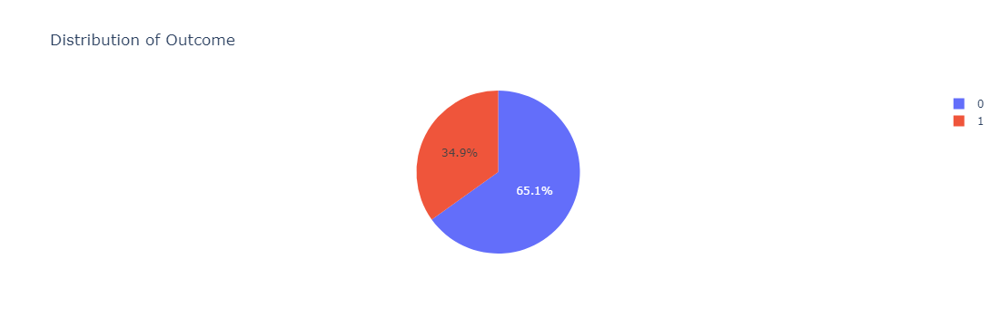

In [66]:
import plotly.express as px
for i in discrete:
 counts = df[i].value_counts()
 fig = px.pie(counts, values=counts.values, names=counts.index,
title=f'Distribution of {i}')
 fig.show()

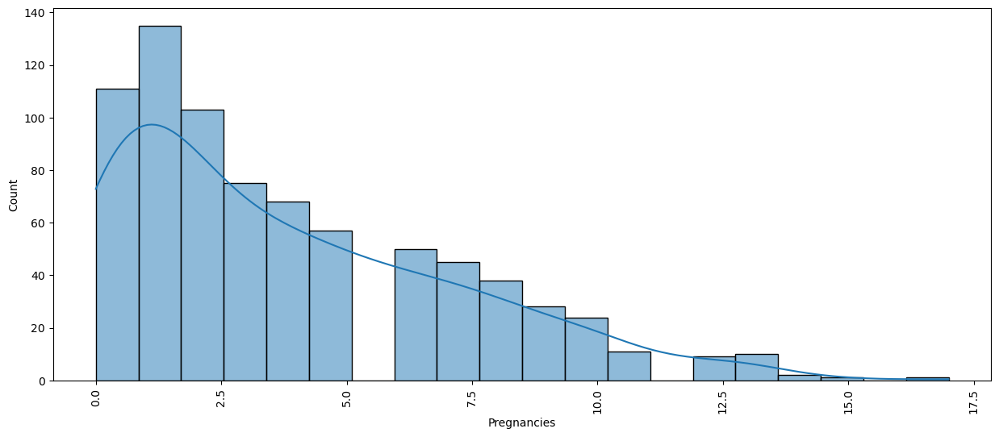

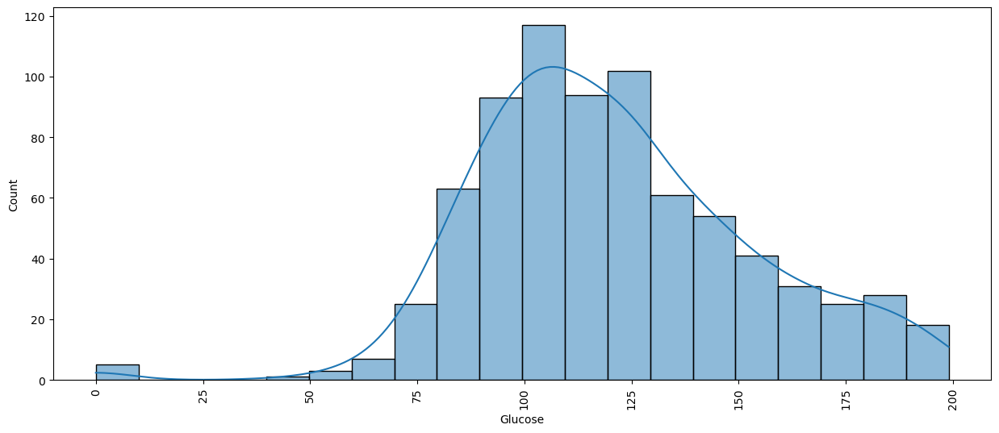

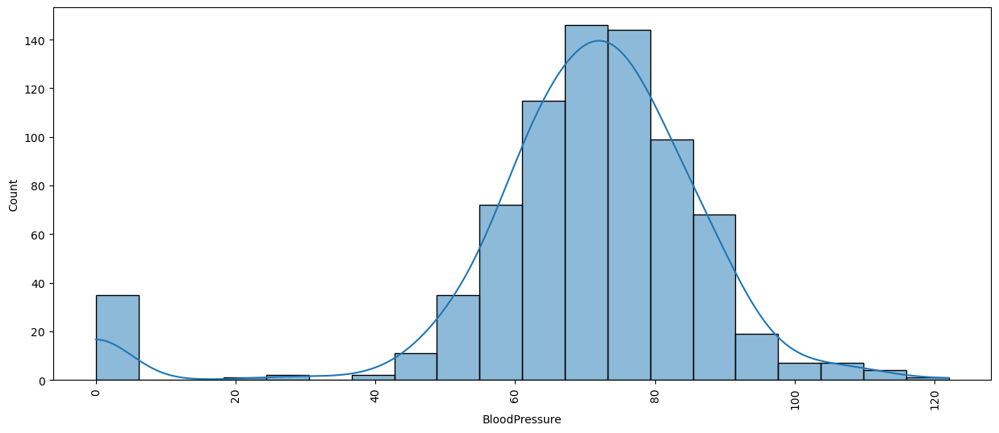

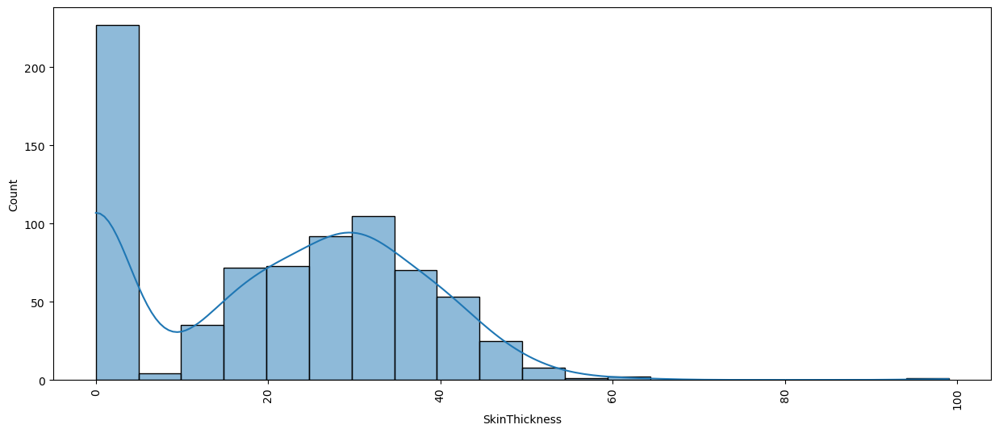

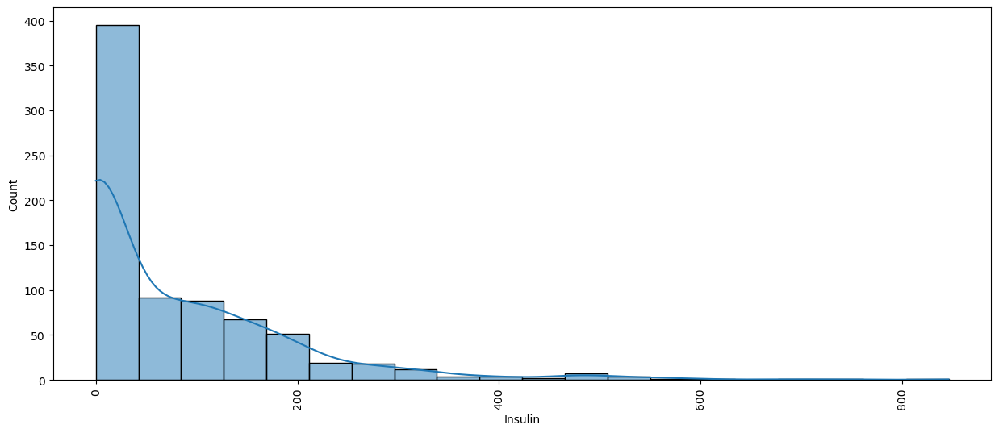

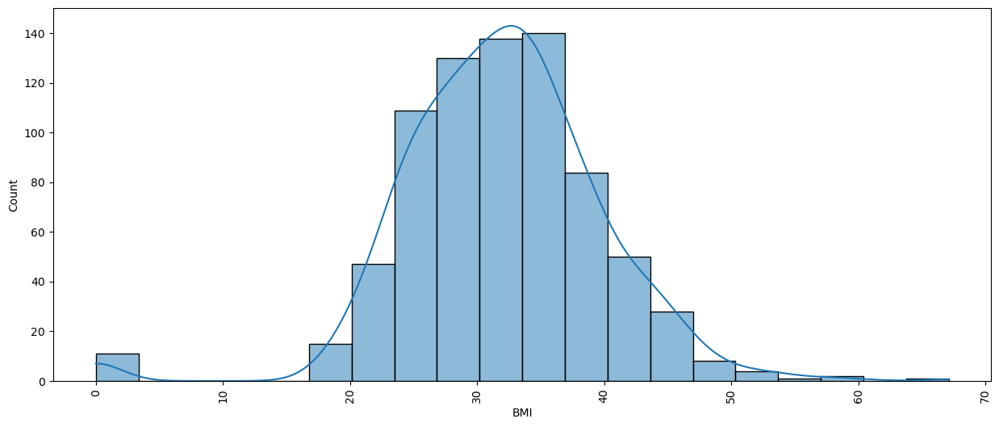

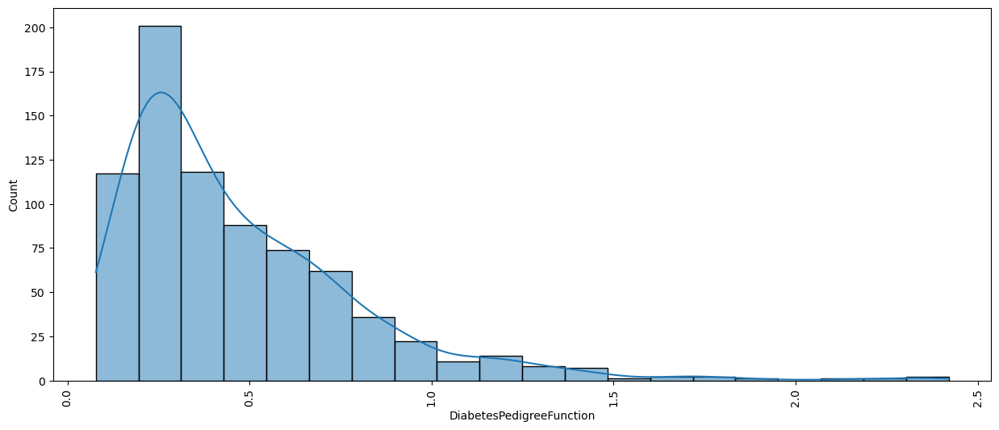

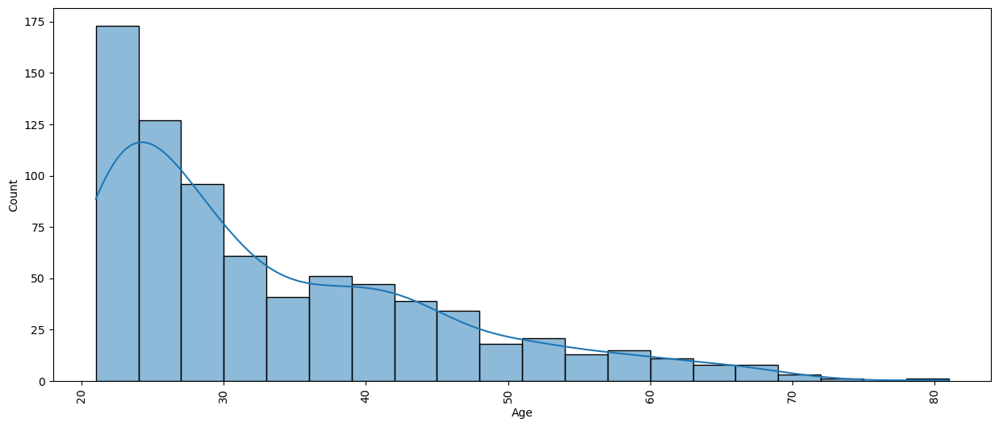

In [68]:
for i in continuous:
 plt.figure(figsize=(15,6))
 sns.histplot(df[i], bins = 20, kde = True, palette='hls')
 plt.xticks(rotation = 90)
 plt.show()

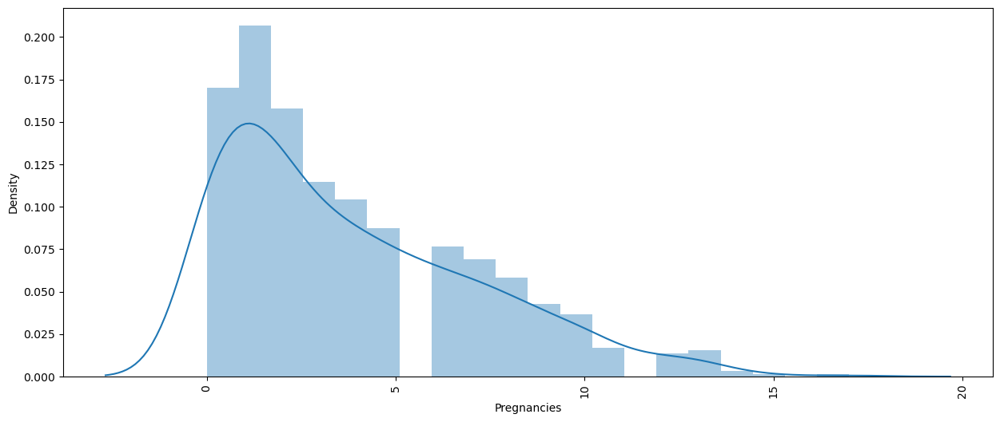

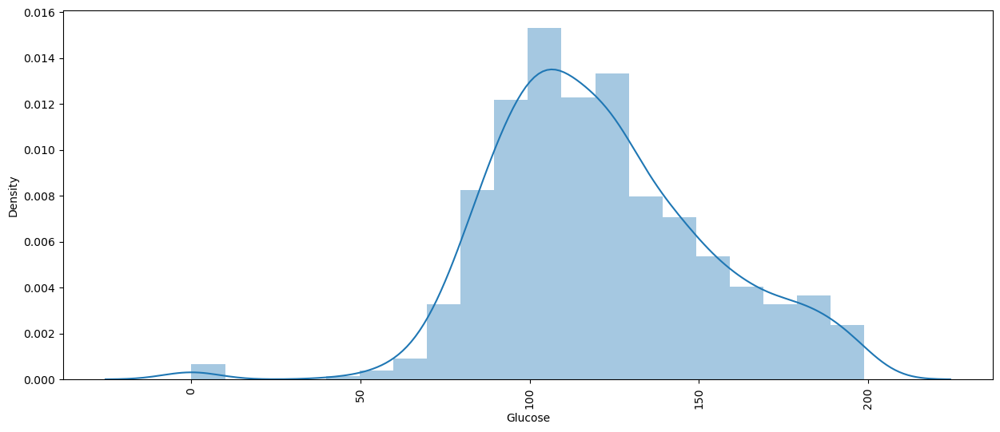

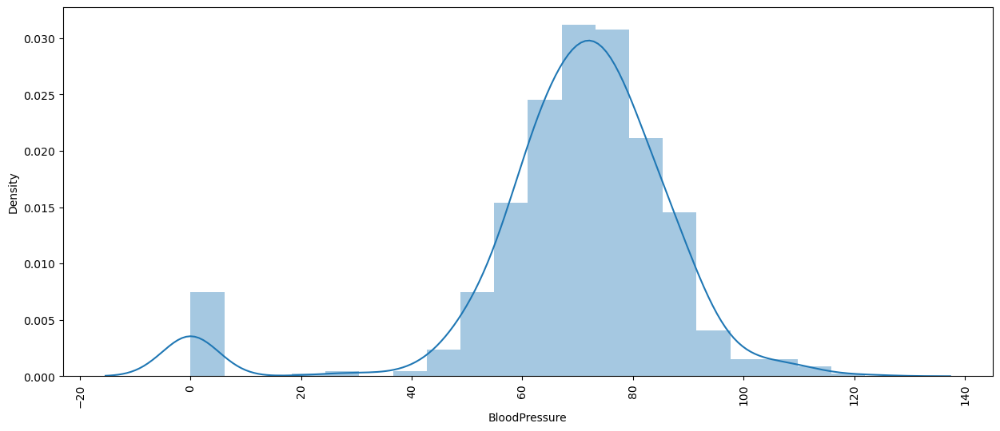

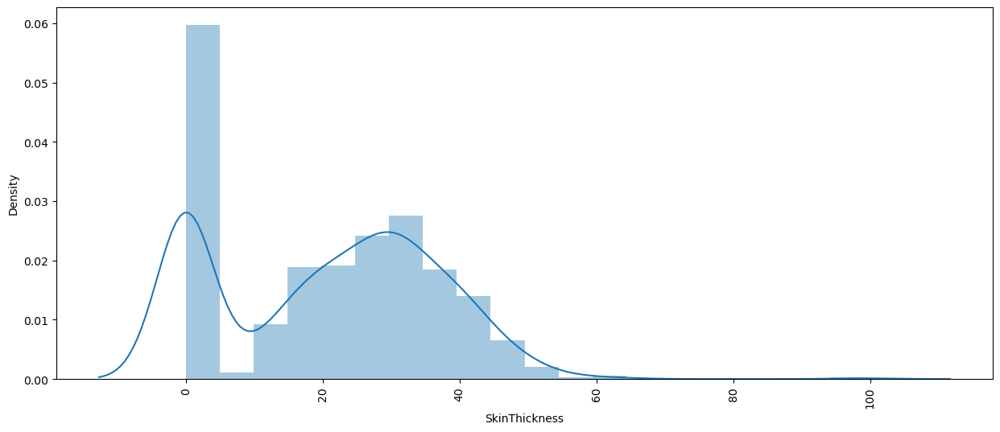

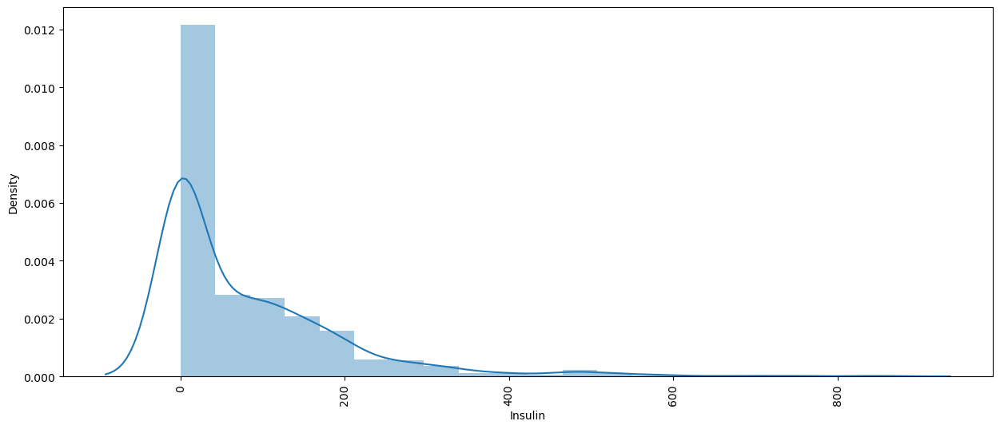

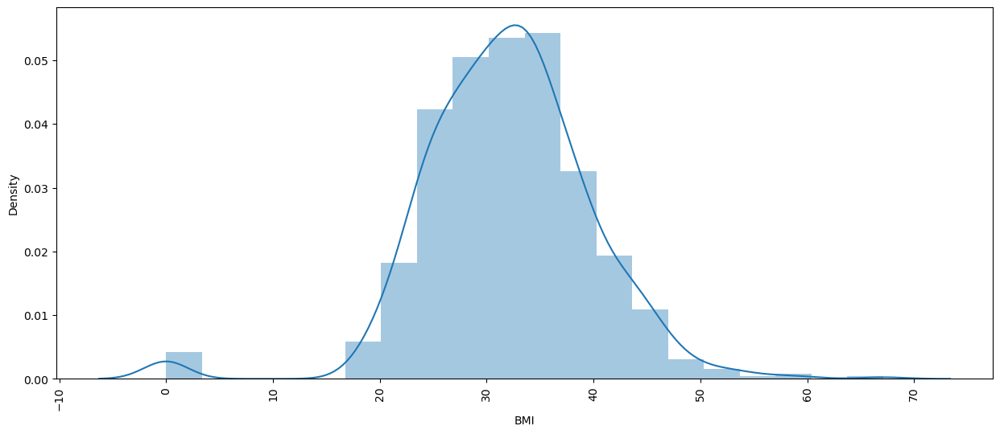

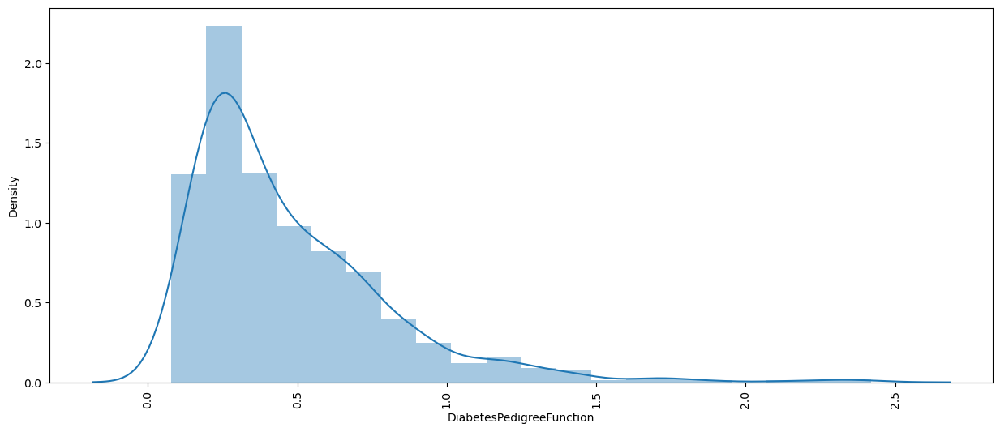

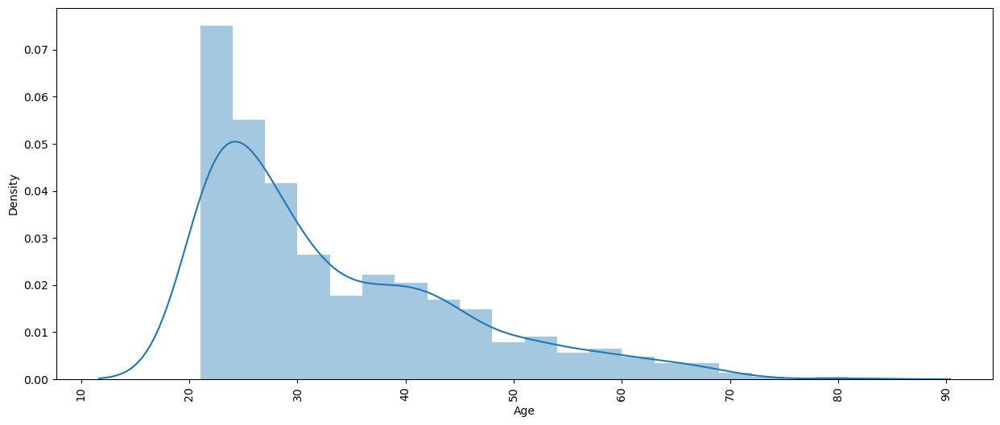

In [69]:
for i in continuous:
 plt.figure(figsize=(15,6))
 sns.distplot(df[i], bins = 20, kde = True)
 plt.xticks(rotation = 90)
 plt.show()

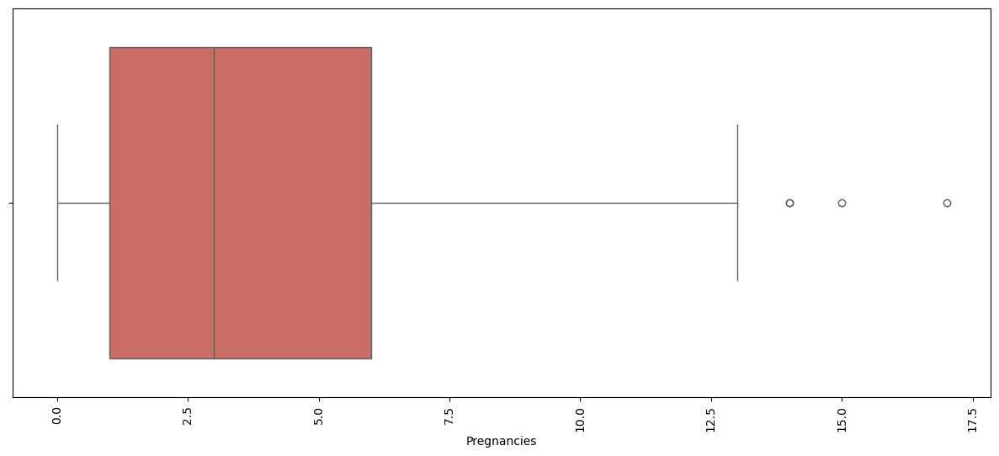

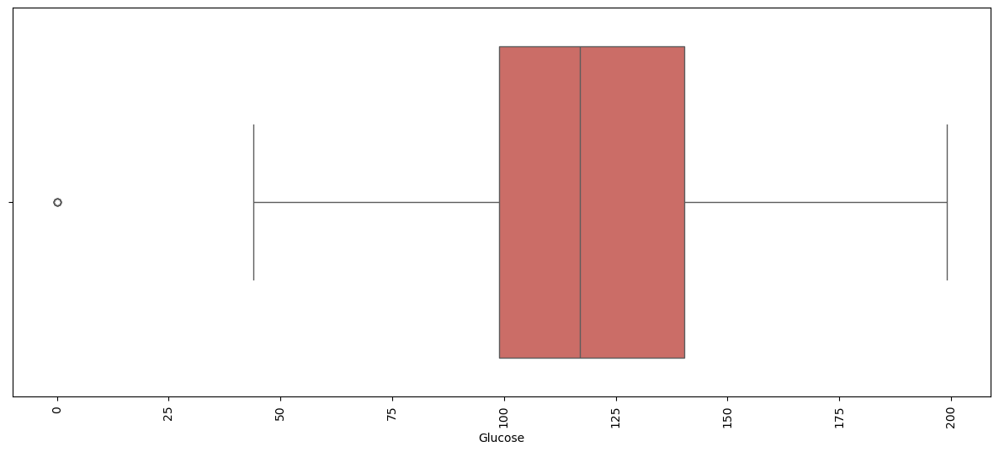

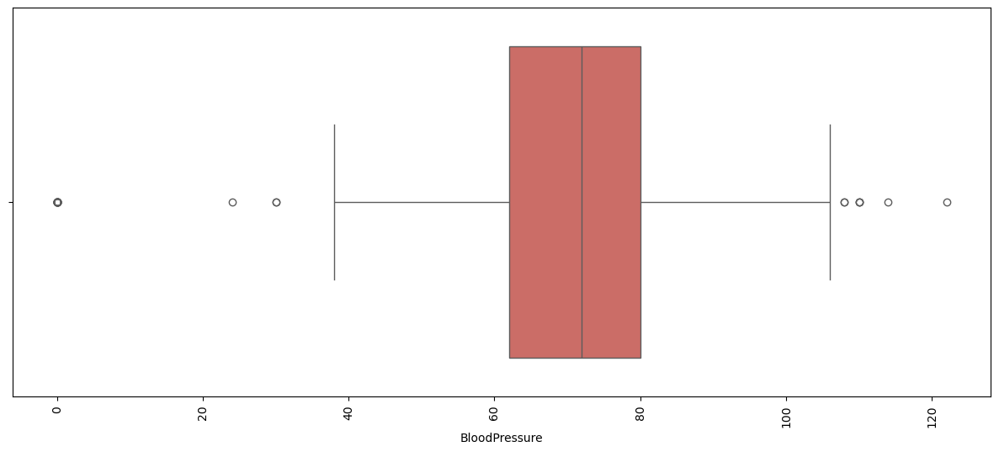

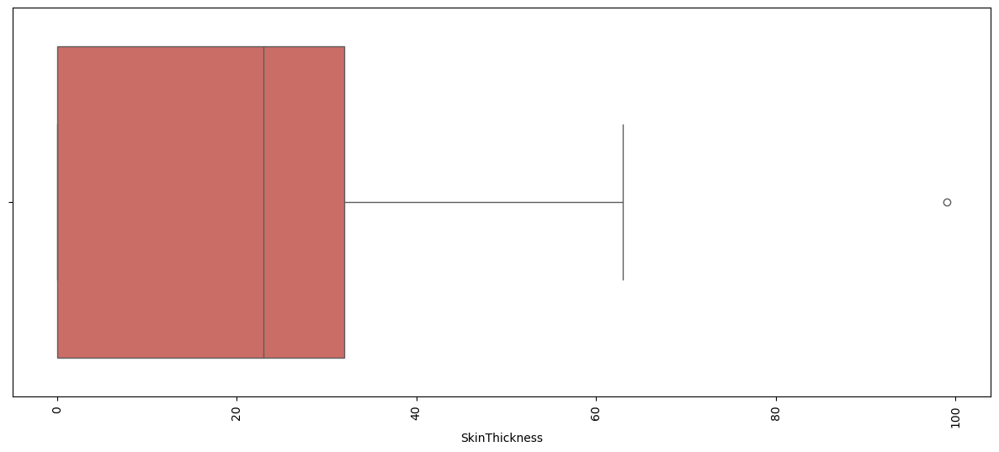

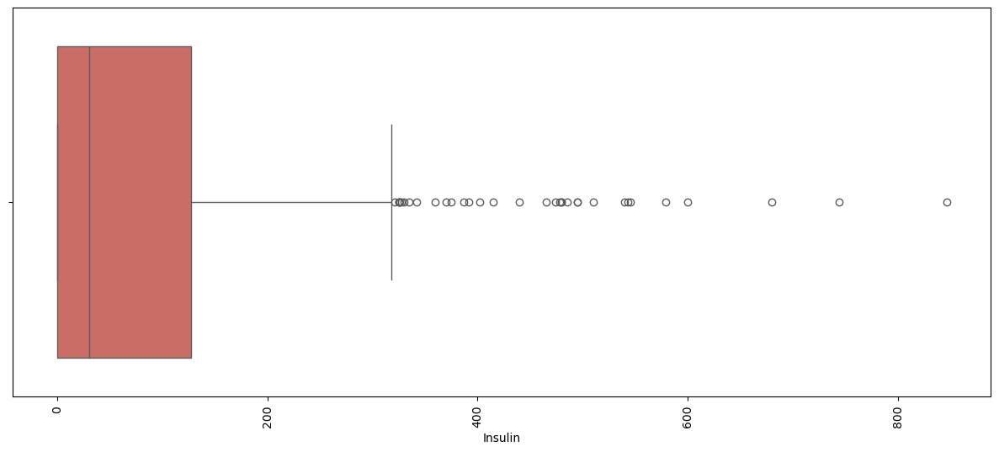

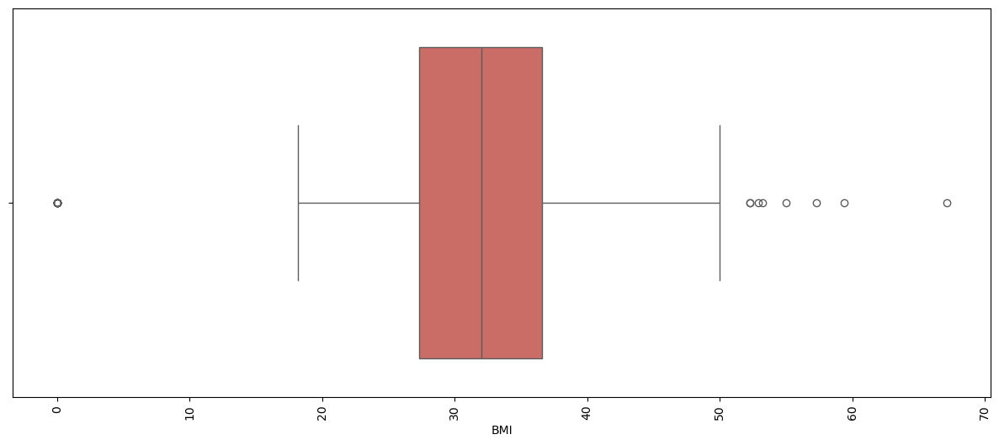

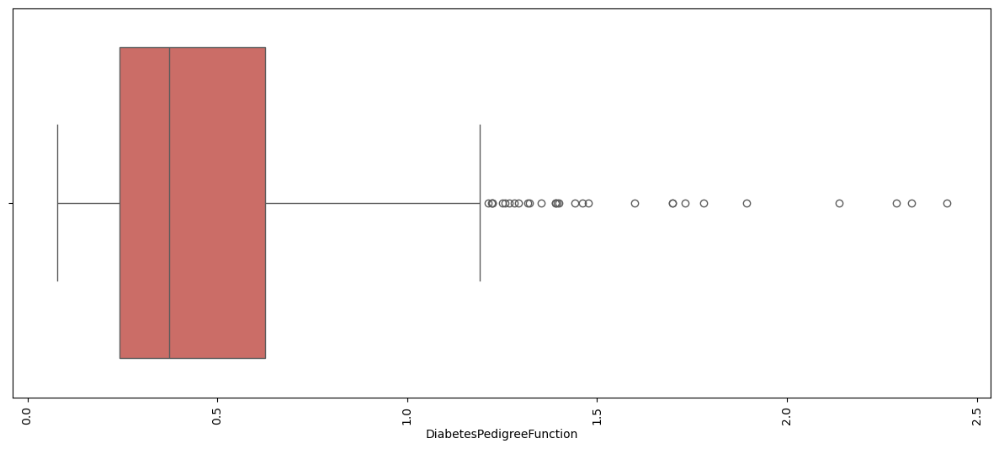

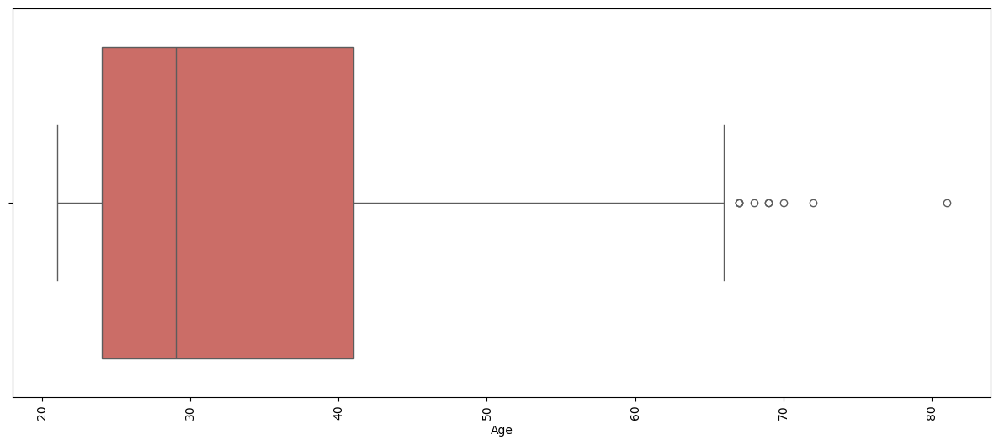

In [72]:
for i in continuous:
 plt.figure(figsize=(15, 6))
 sns.boxplot(x=i, data=df, palette='hls')
 plt.xticks(rotation=90)
 plt.show()

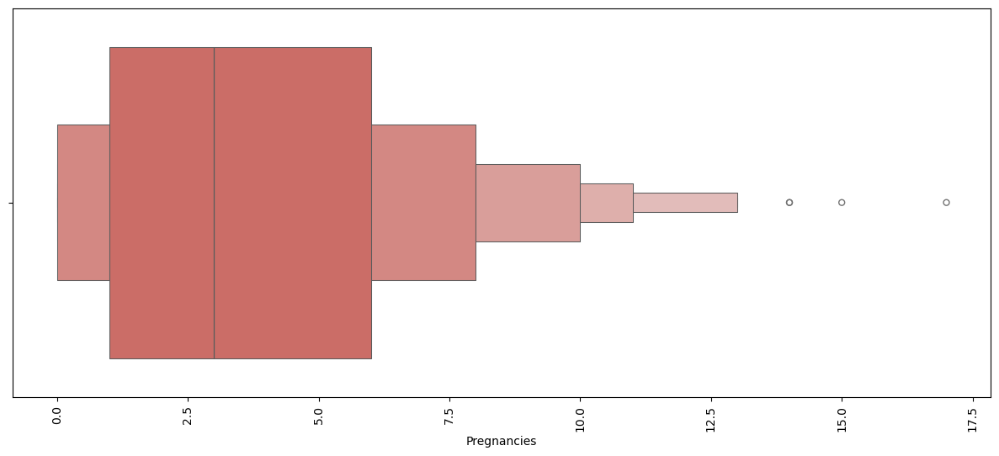

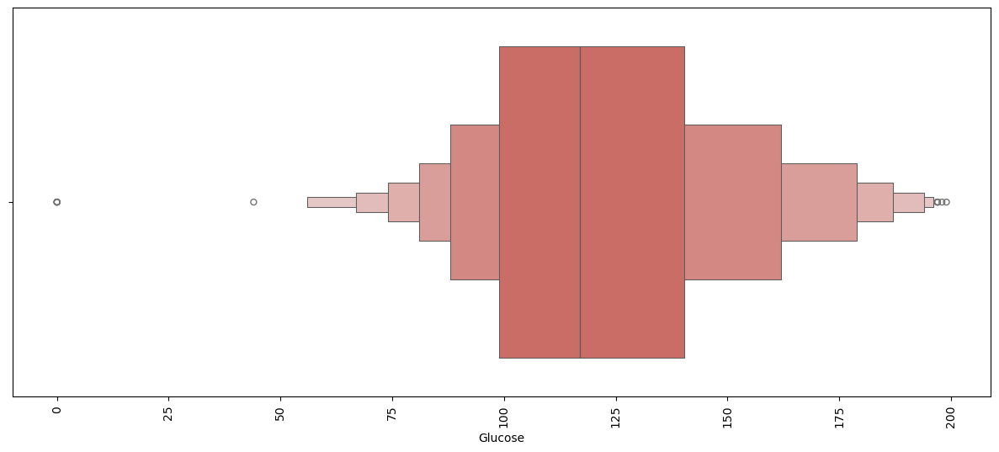

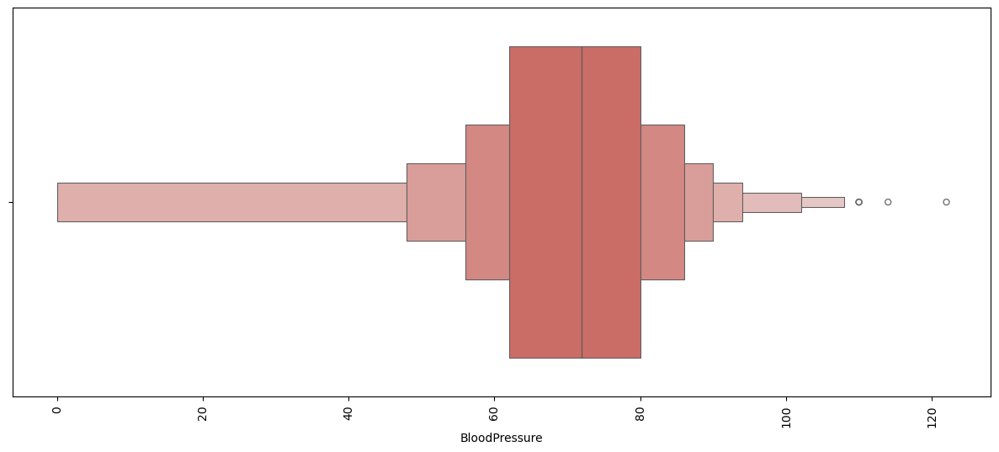

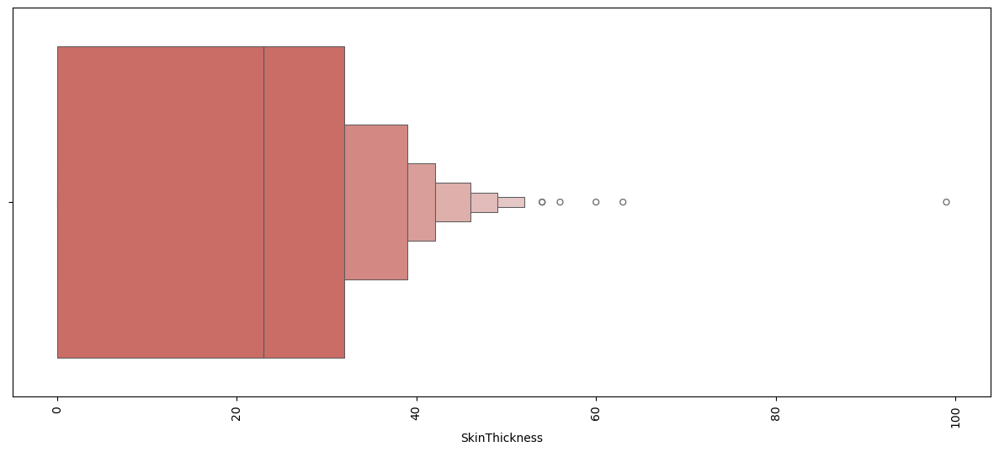

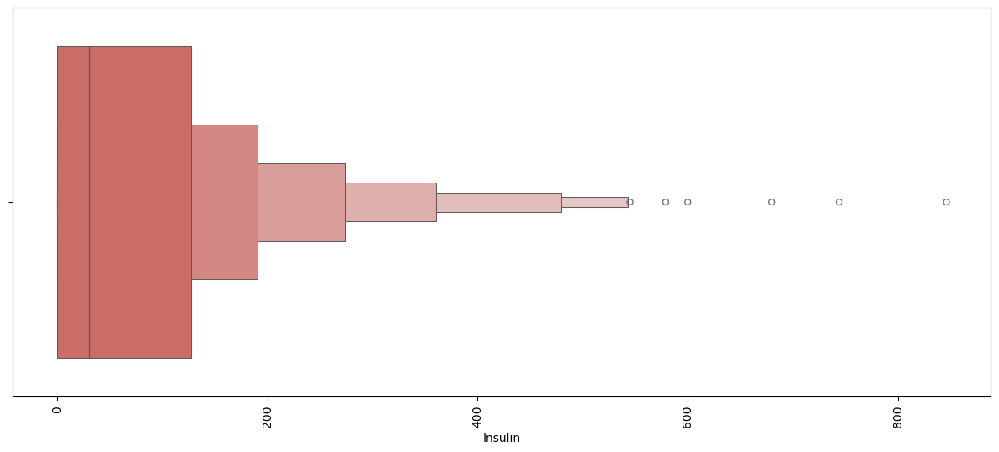

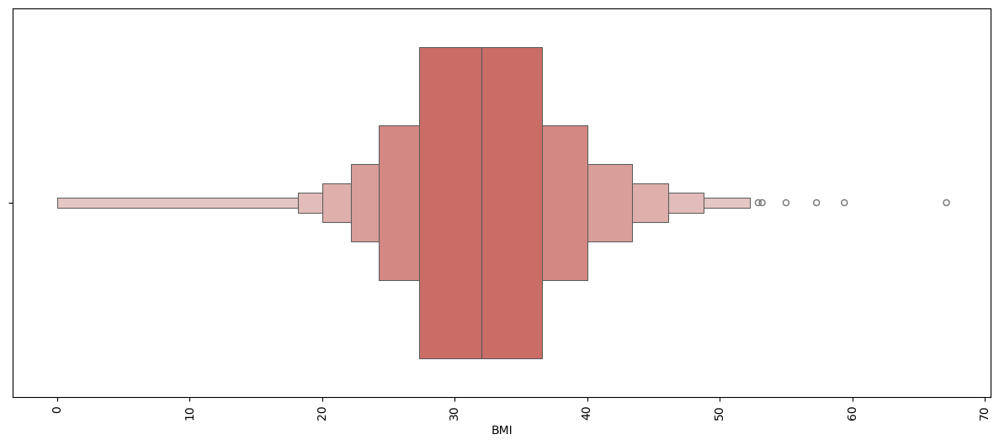

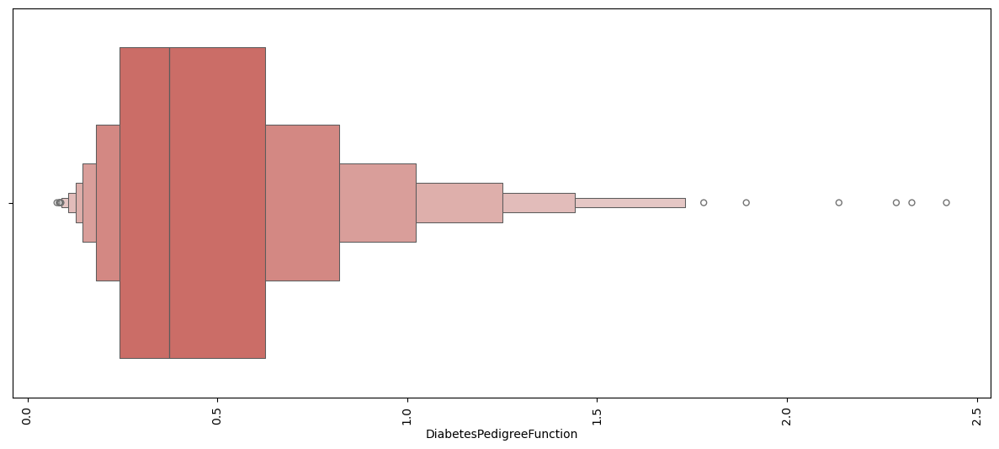

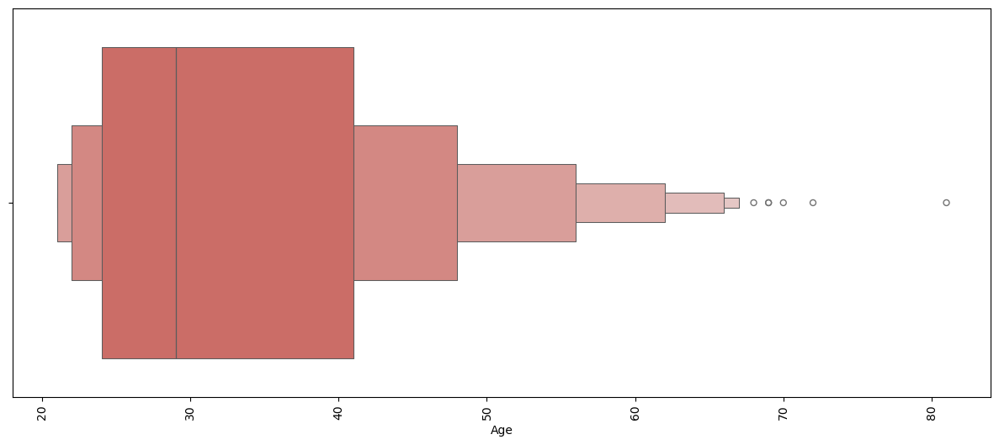

In [74]:
for i in continuous:
 plt.figure(figsize=(15, 6))
 sns.boxenplot(x=i, data=df, palette='hls')
 plt.xticks(rotation=90)
 plt.show()

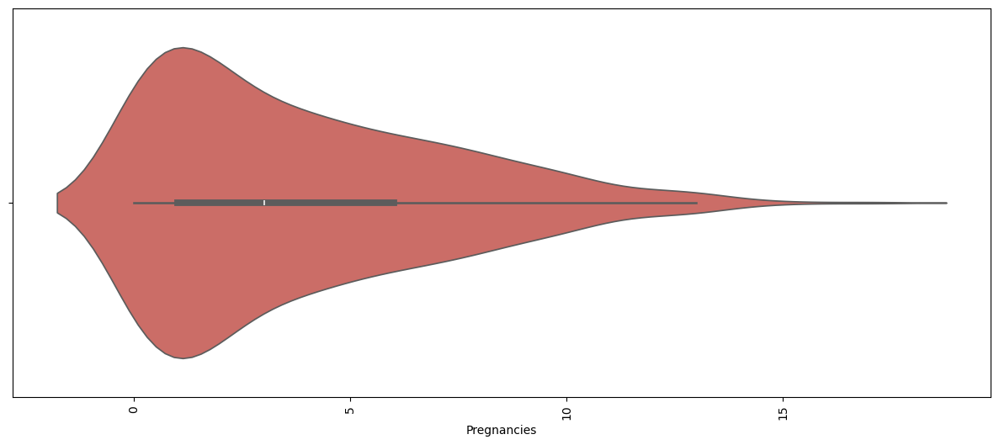

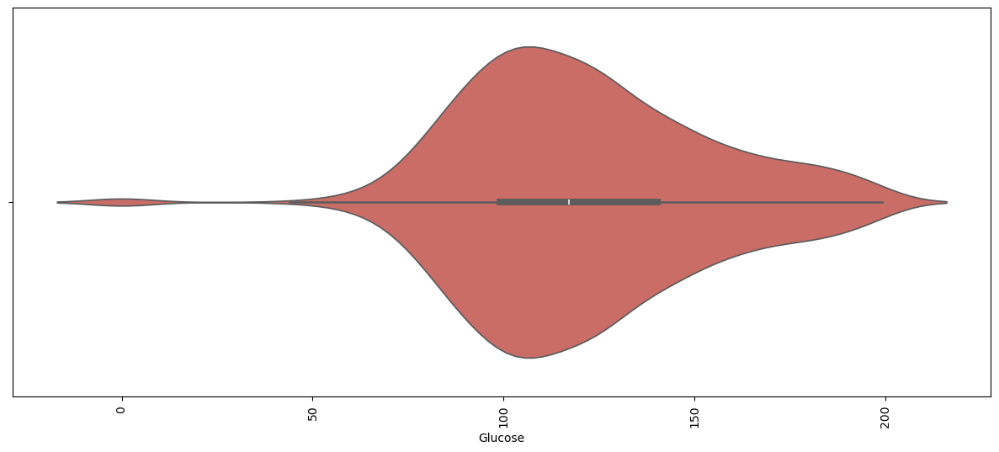

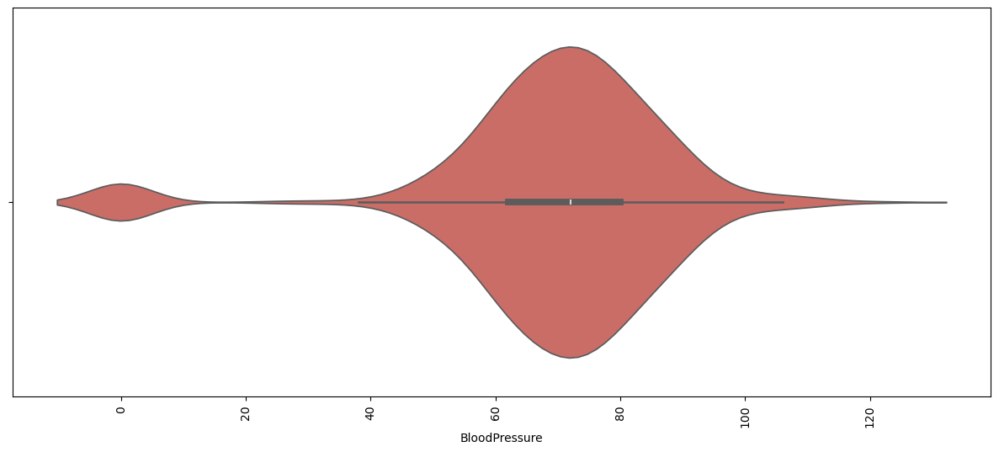

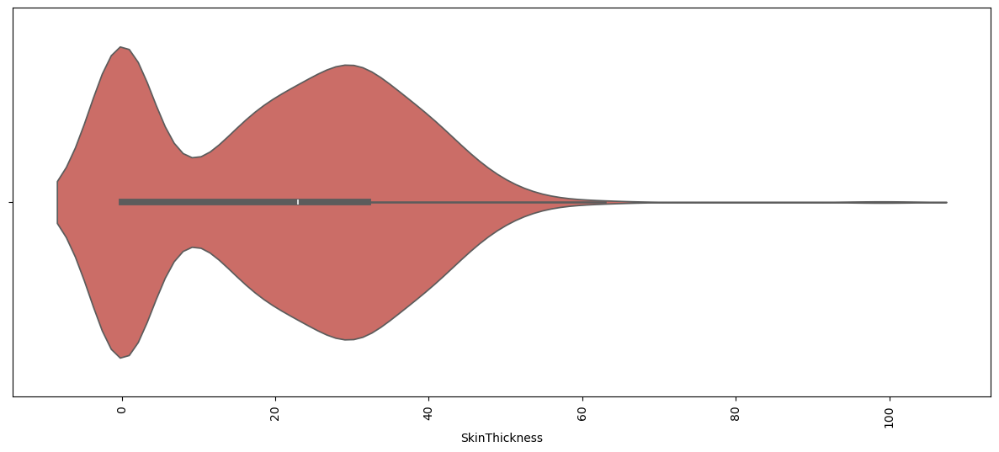

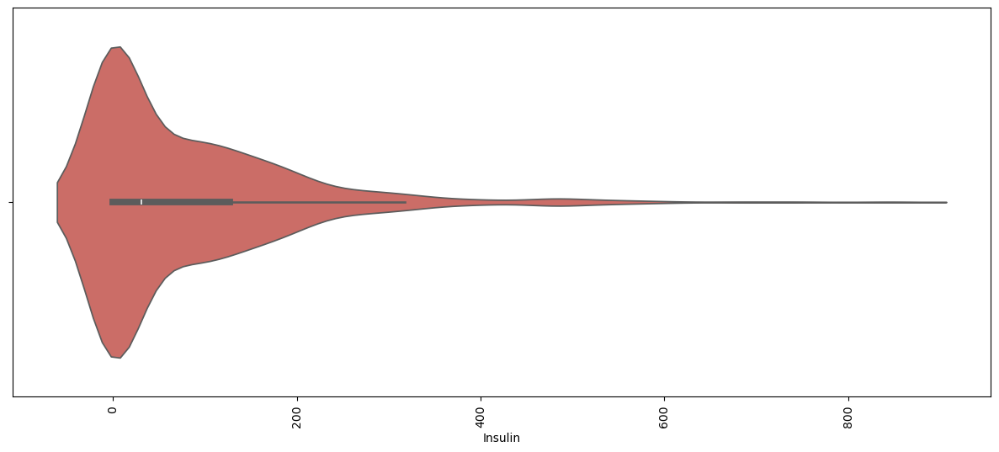

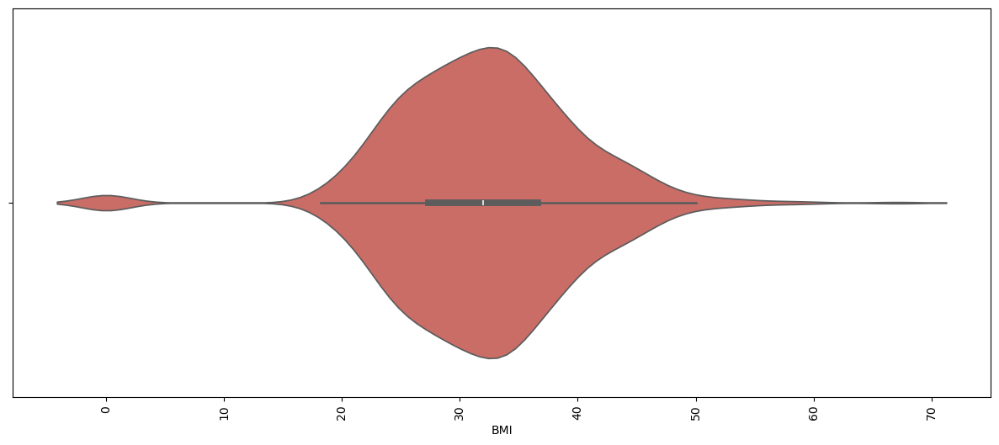

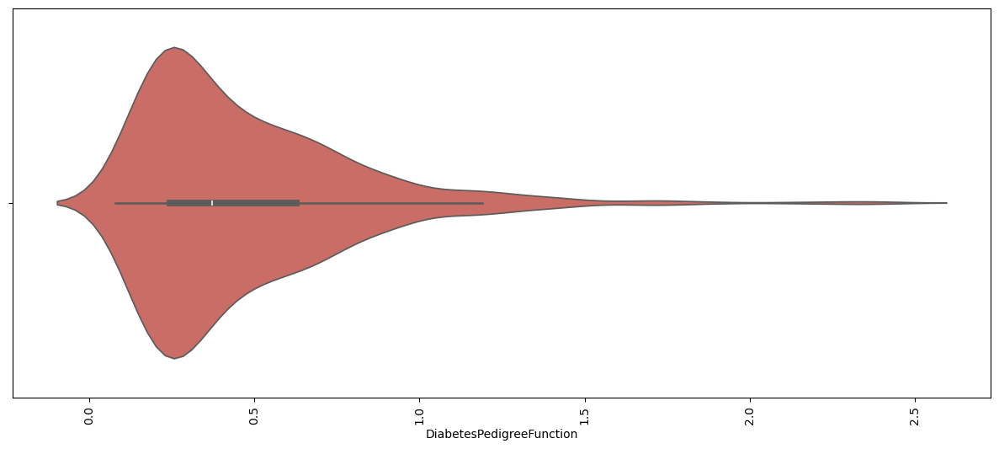

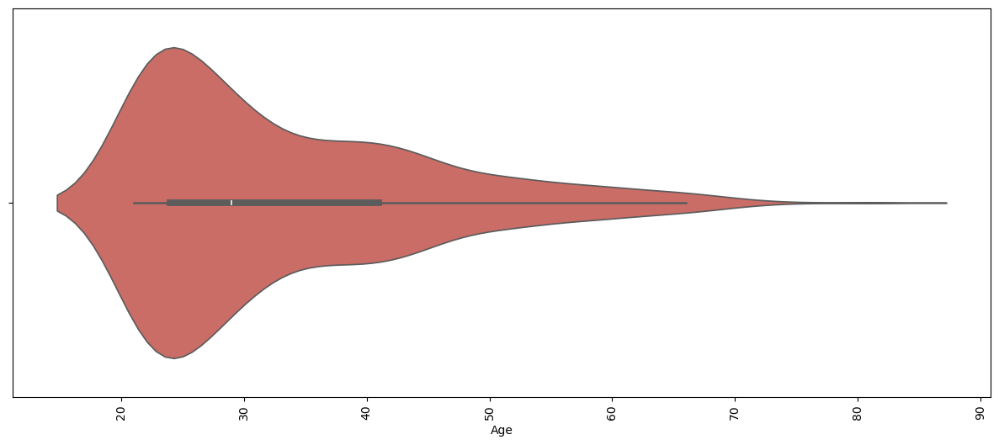

In [76]:
for i in continuous:
 plt.figure(figsize=(15, 6))
 sns.violinplot(x=i, data=df, palette='hls')
 plt.xticks(rotation=90)
 plt.show()

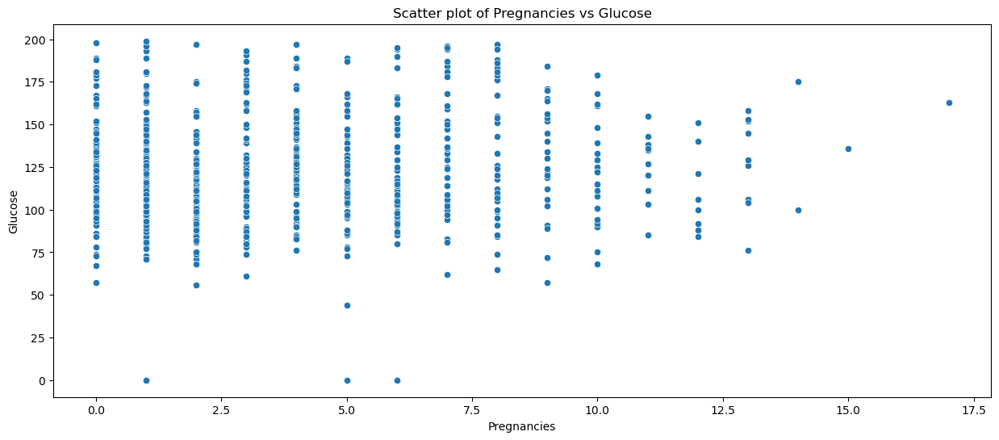

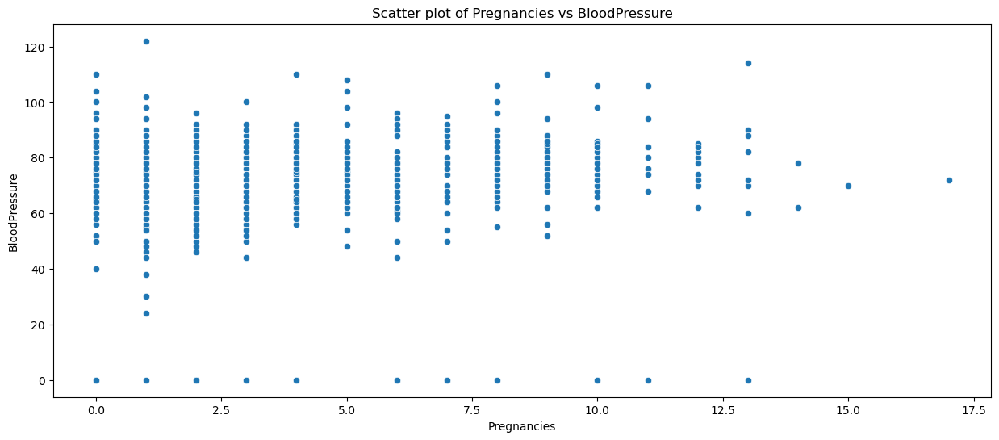

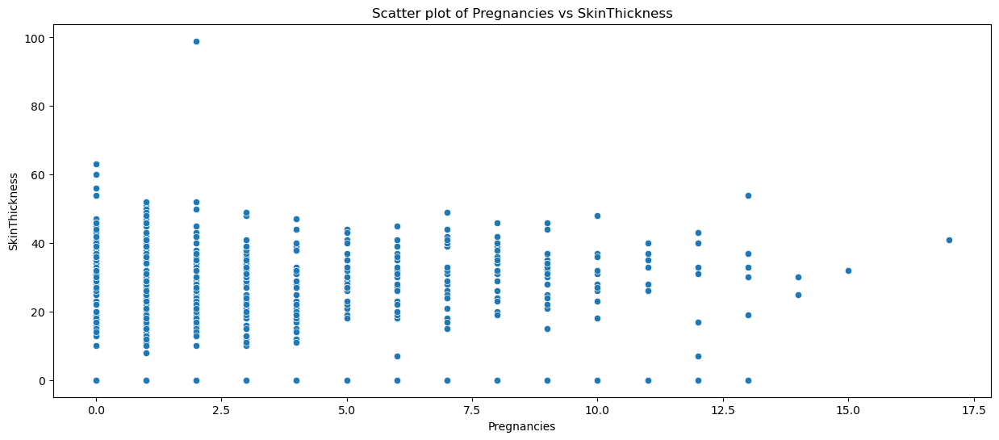

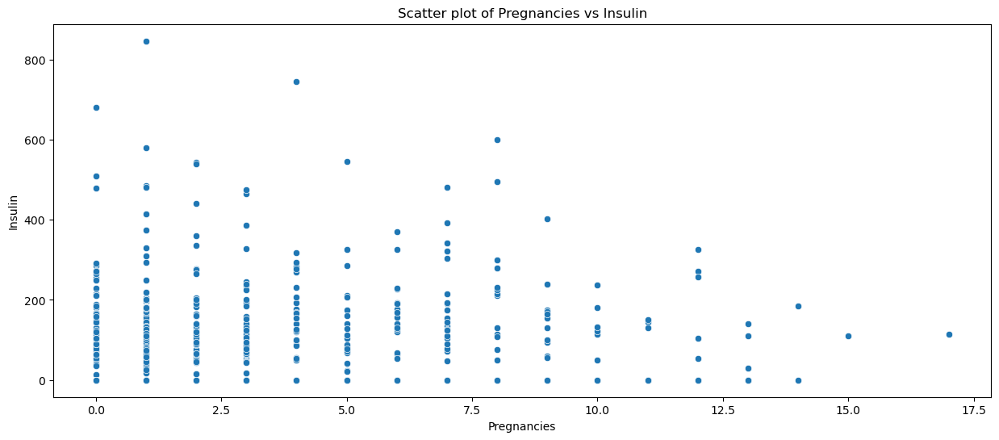

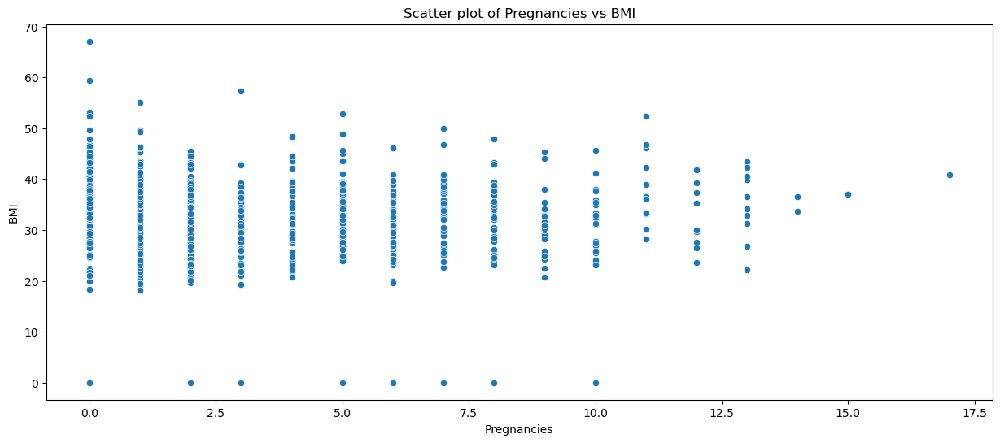

...

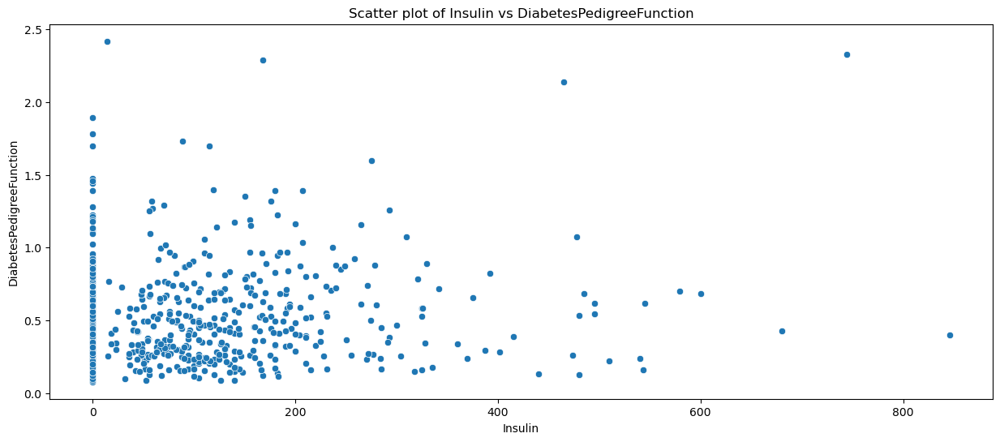

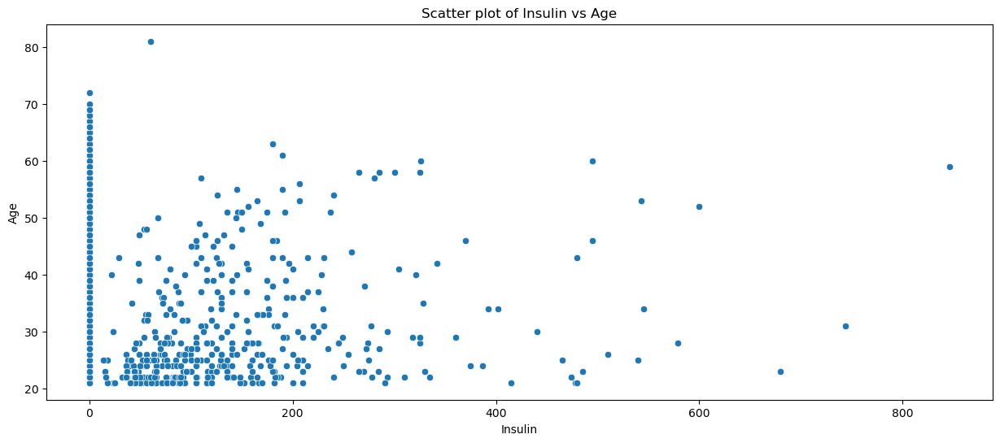

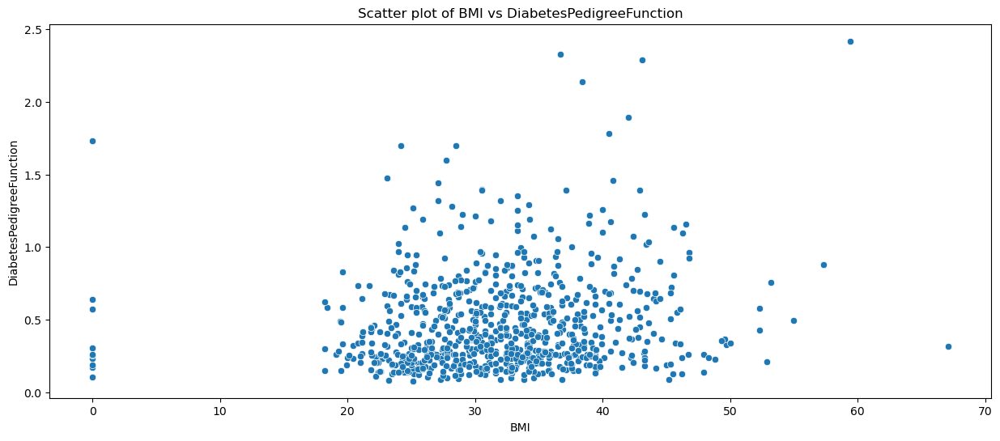

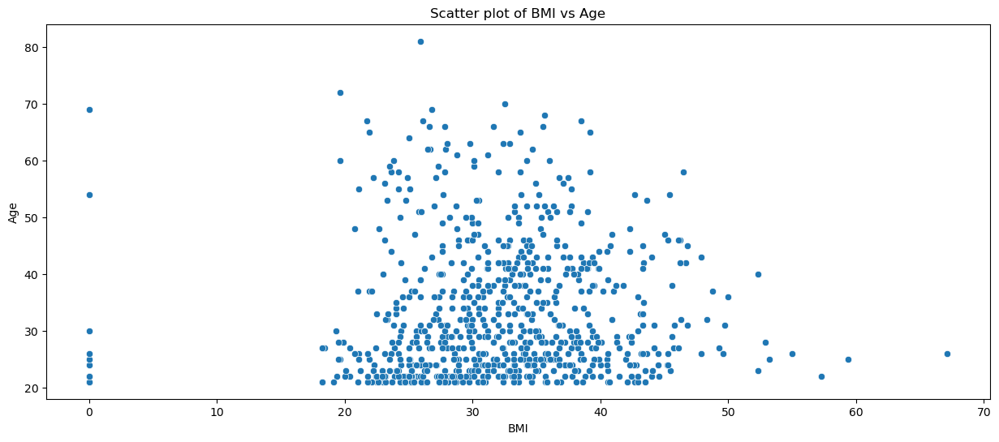

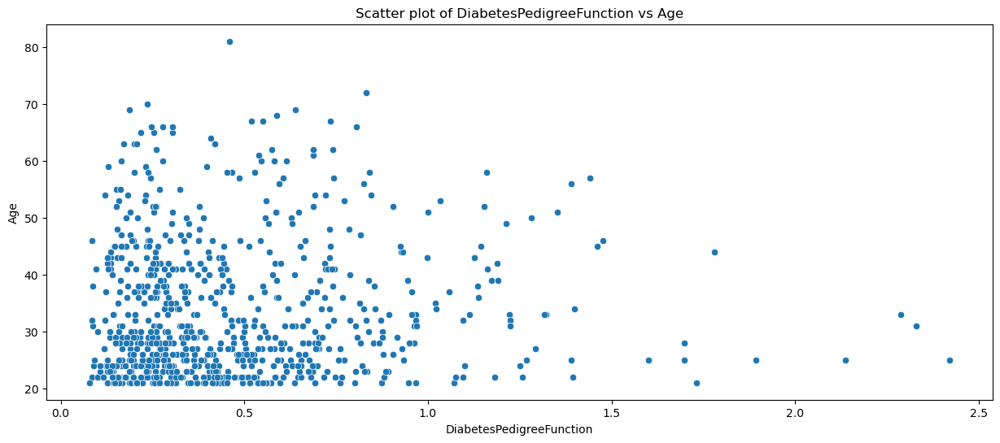

In [88]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.scatterplot(x=continuous[i], y=continuous[j], data=df,palette='hls')
        plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
        plt.show()

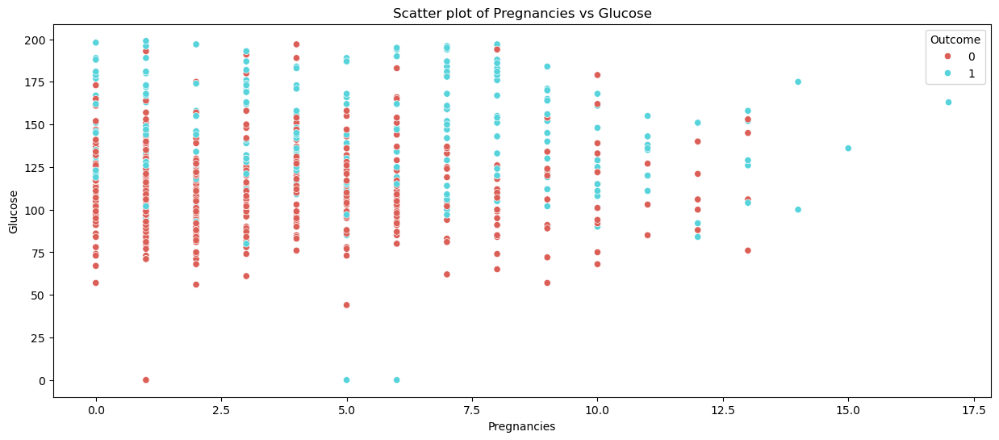

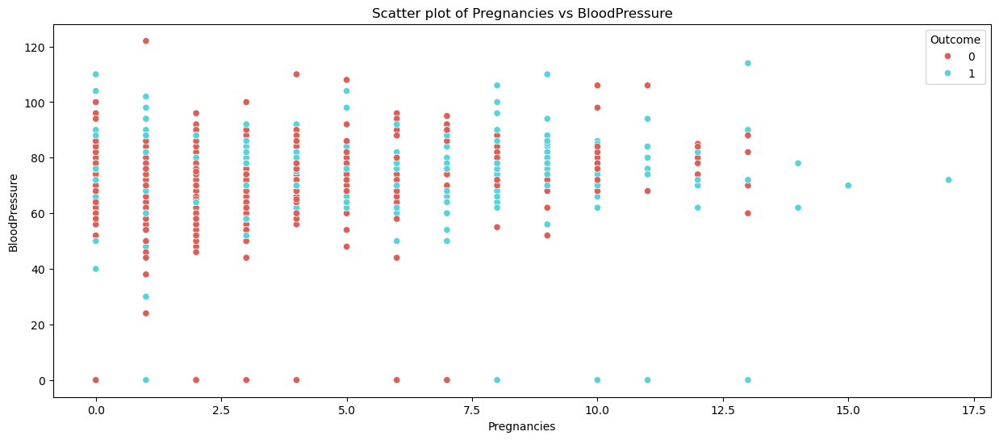

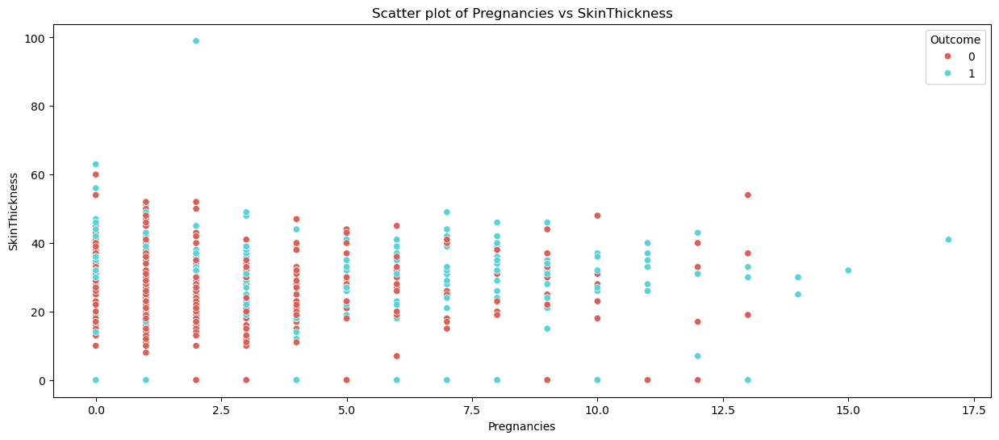

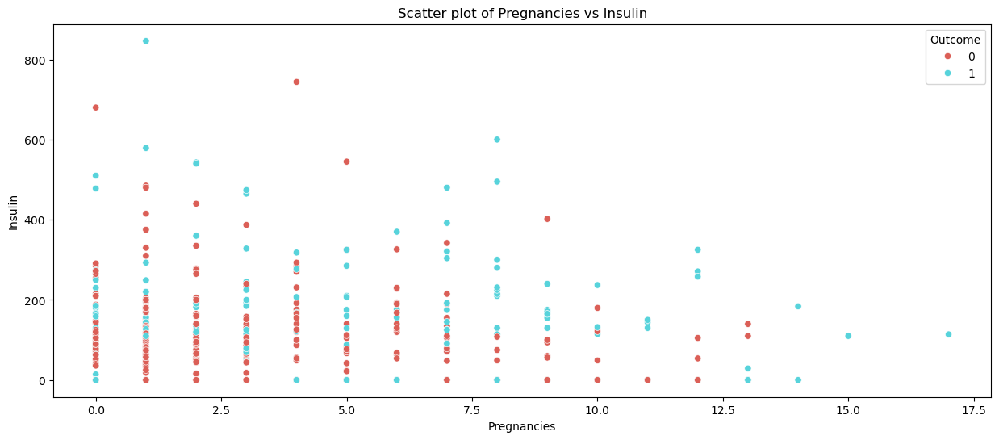

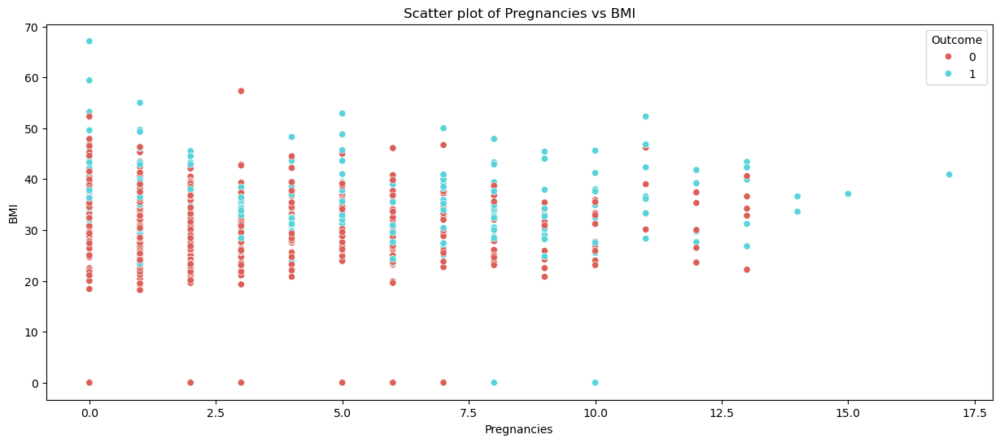

...

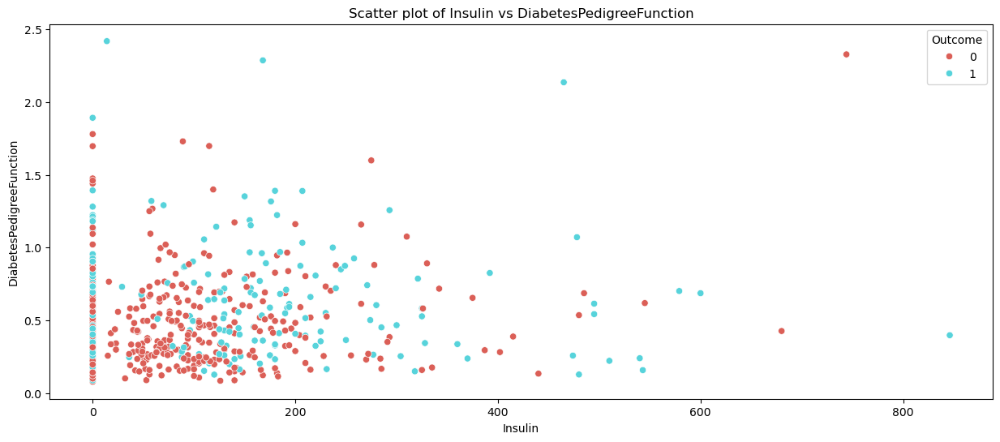

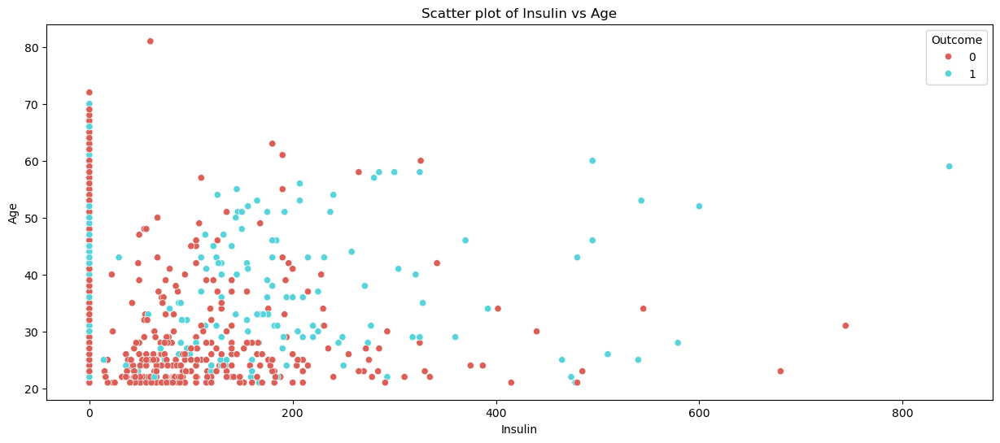

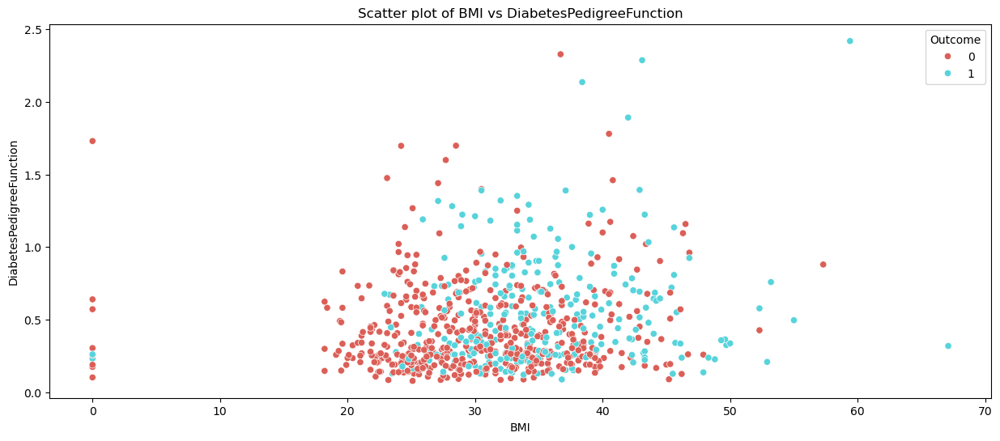

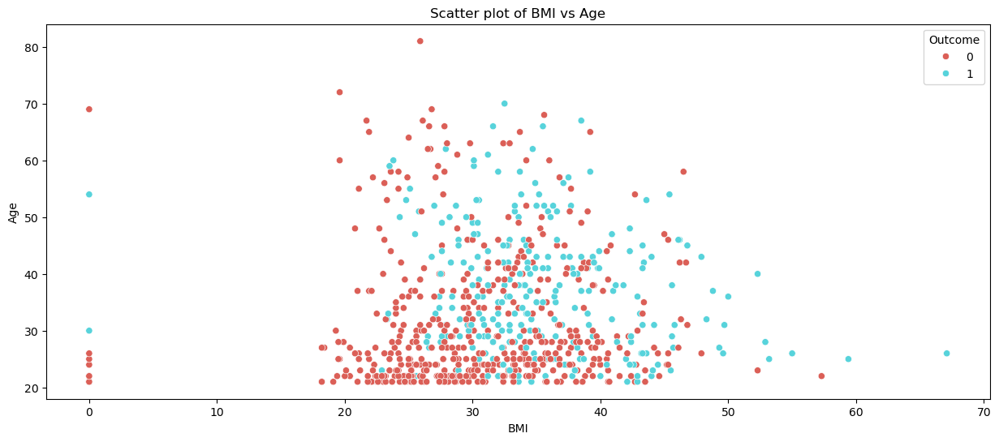

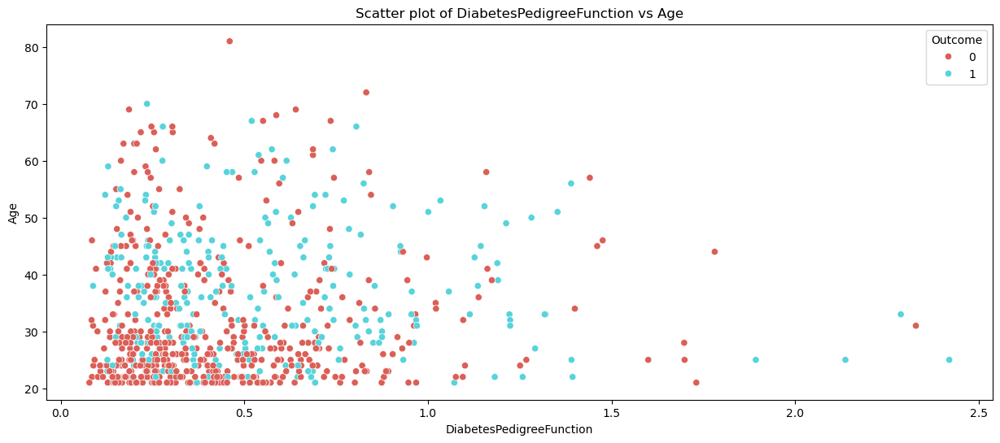

In [92]:
for i in range(len(continuous)):
 for j in range(i + 1, len(continuous)):
     plt.figure(figsize=(15, 6))
     sns.scatterplot(x=continuous[i], y=continuous[j], data=df, hue= 'Outcome', palette='hls')
     plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
     plt.show()

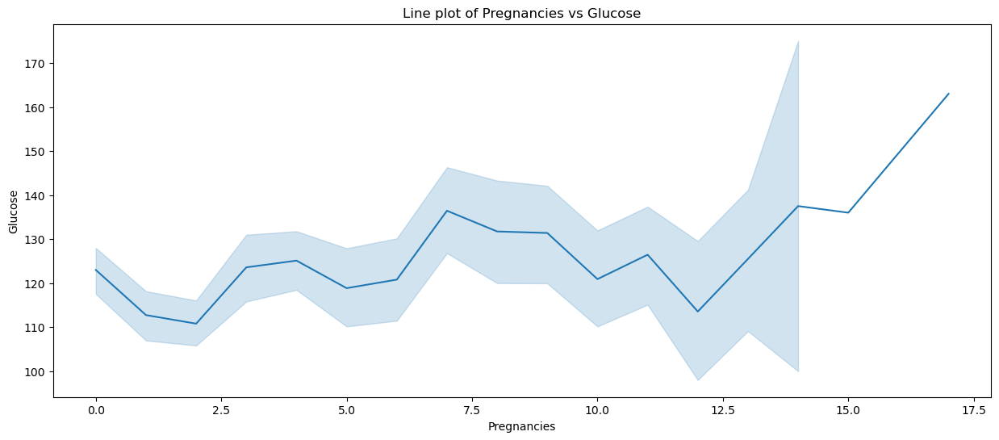

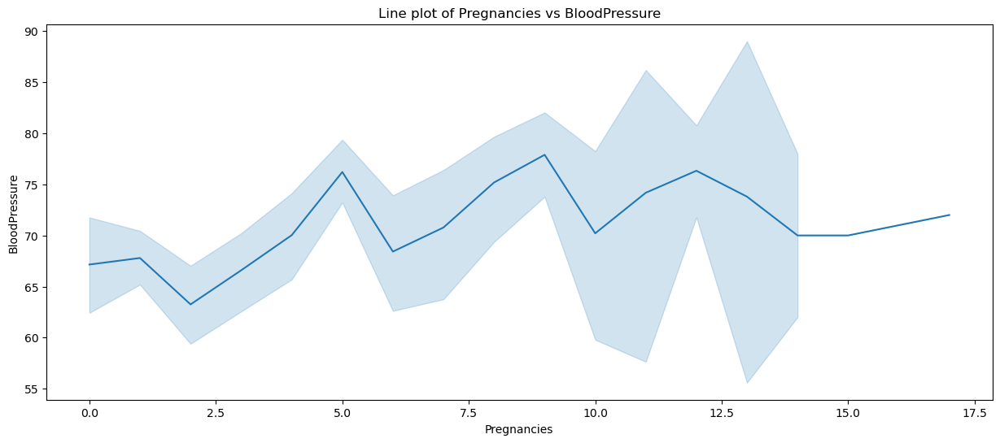

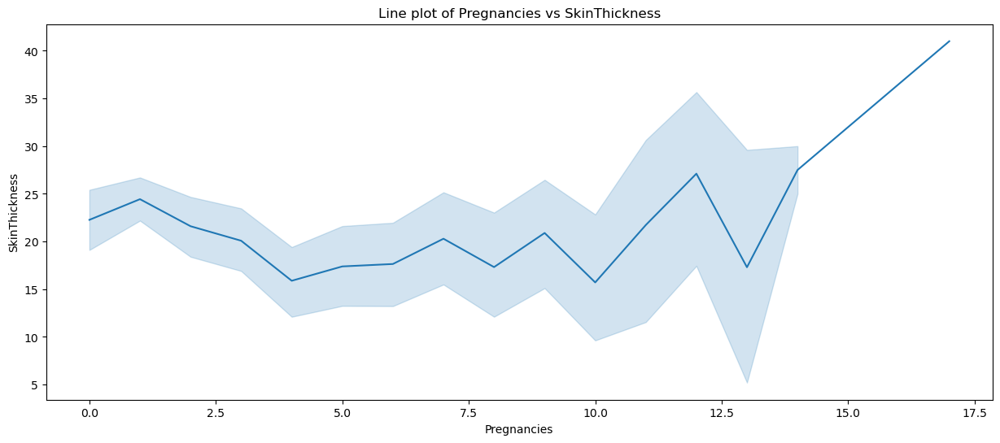

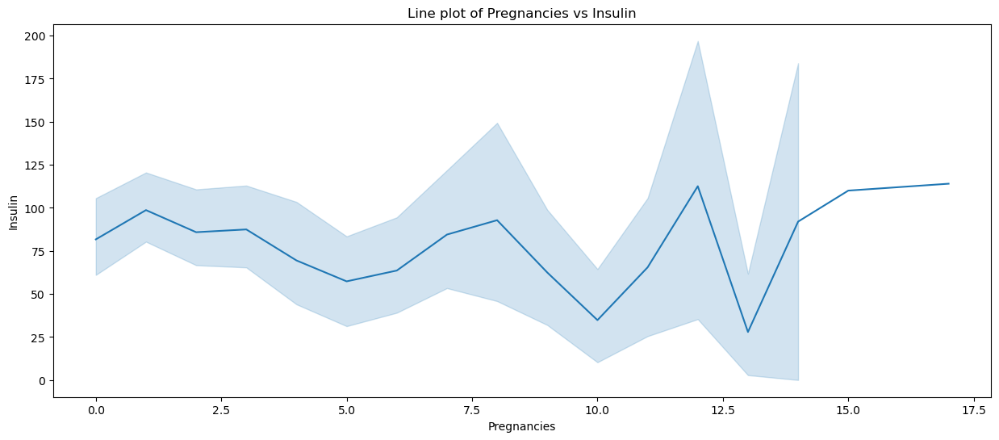

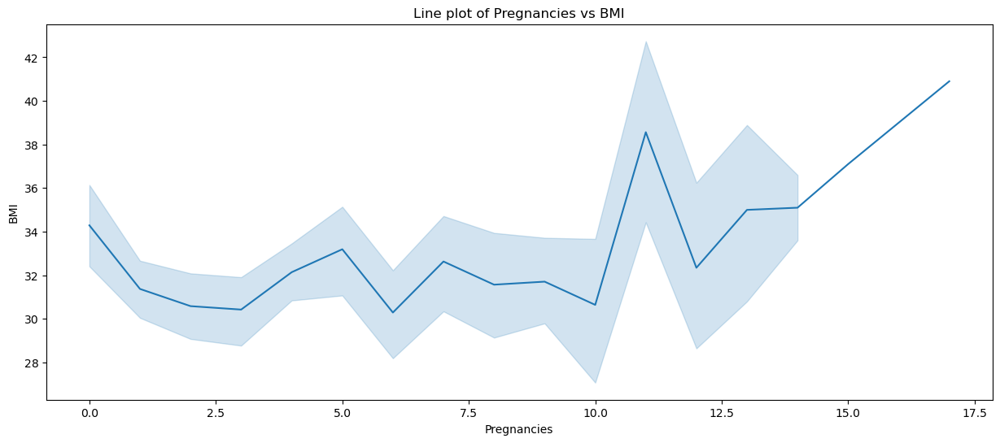

...

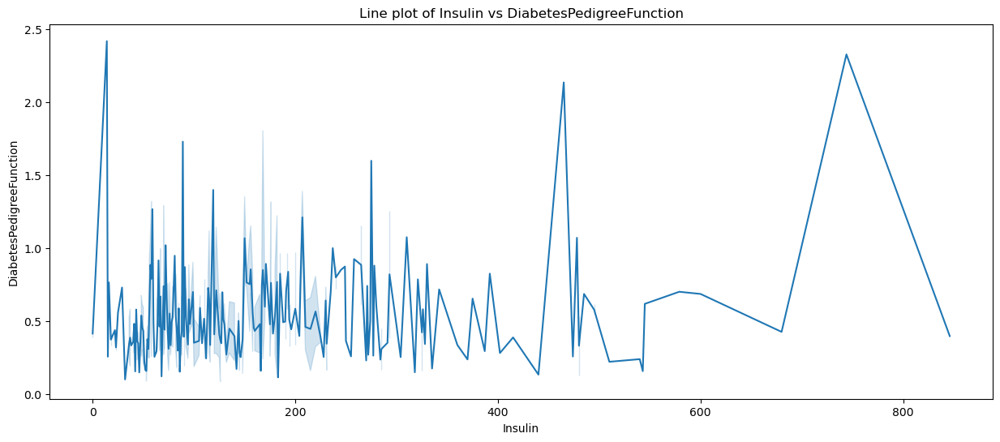

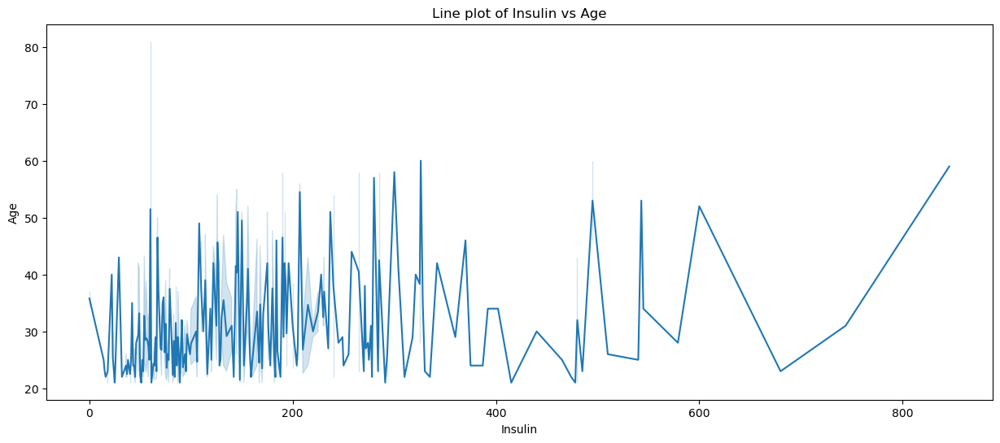

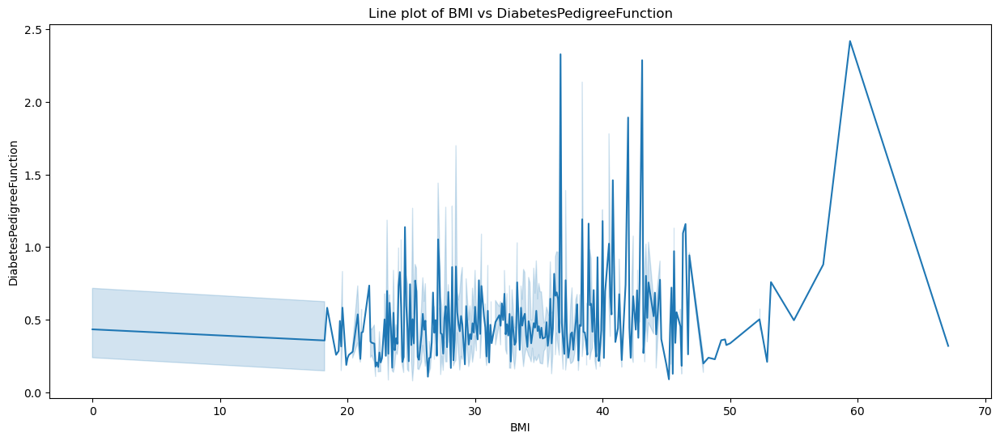

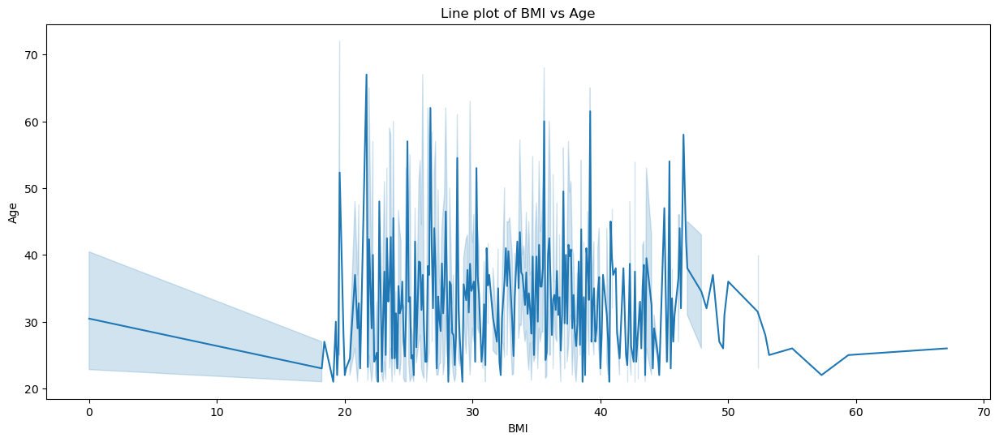

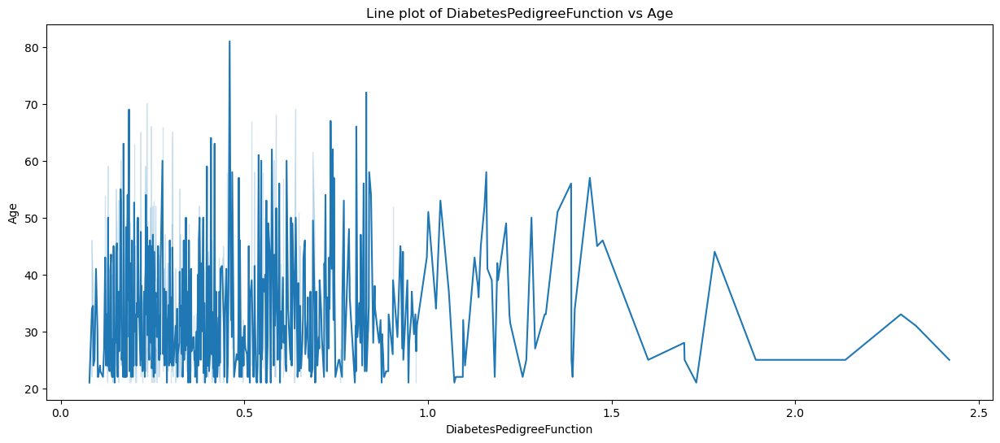

In [96]:
for i in range(len(continuous)):
 for j in range(i + 1, len(continuous)):
     plt.figure(figsize=(15, 6))
     sns.lineplot(x=continuous[i], y=continuous[j], data=df,palette='hls')
     plt.title(f'Line plot of {continuous[i]} vs {continuous[j]}')
     plt.show()

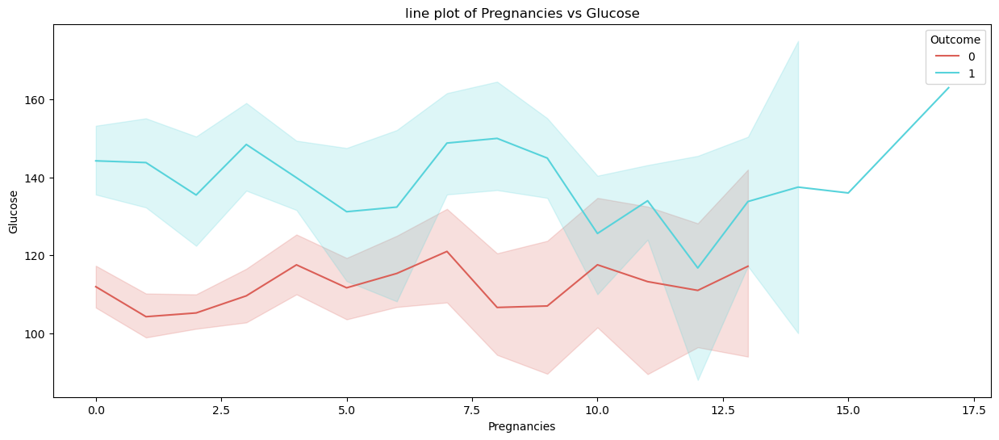

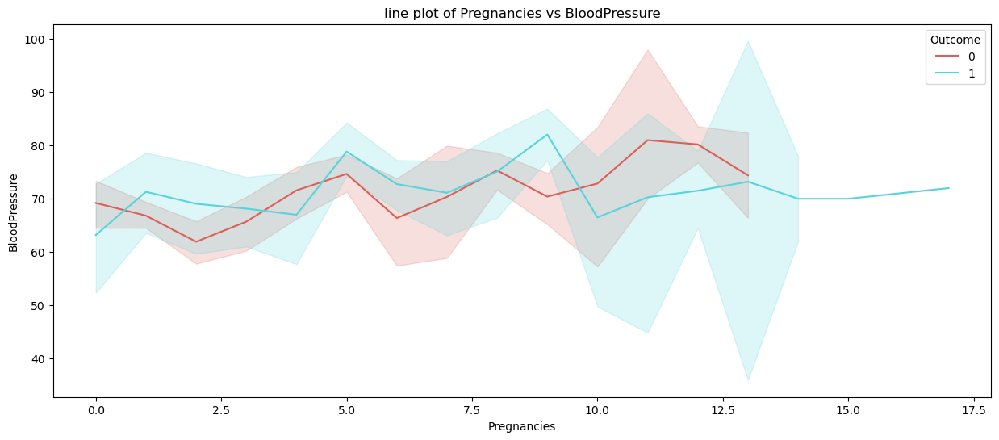

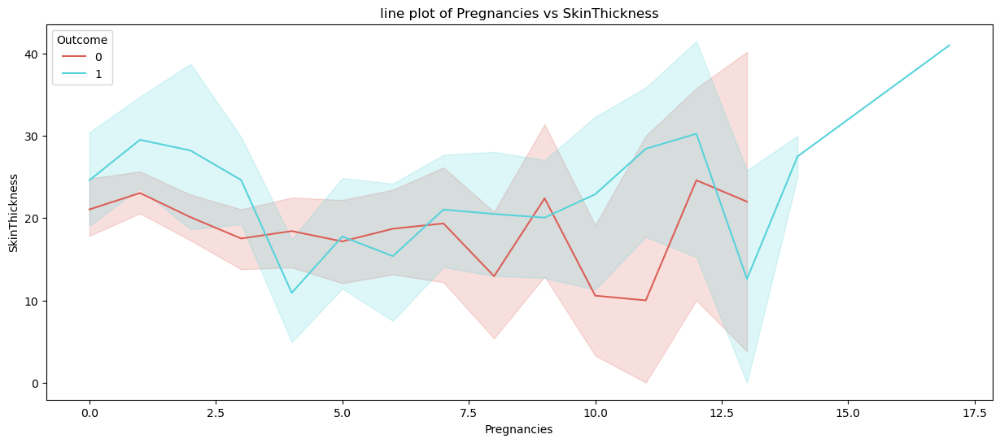

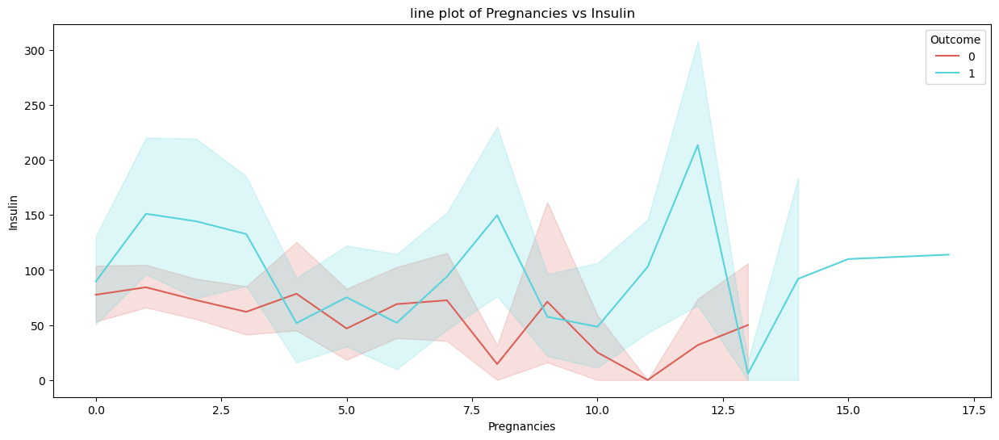

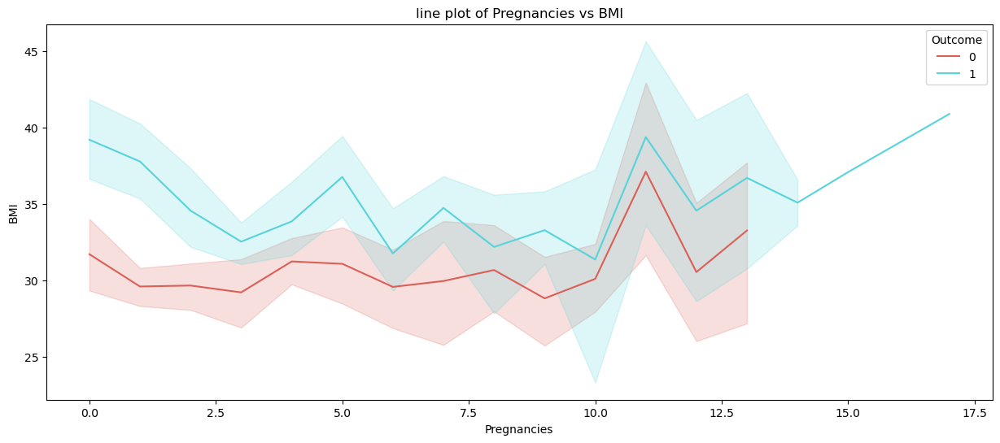

...

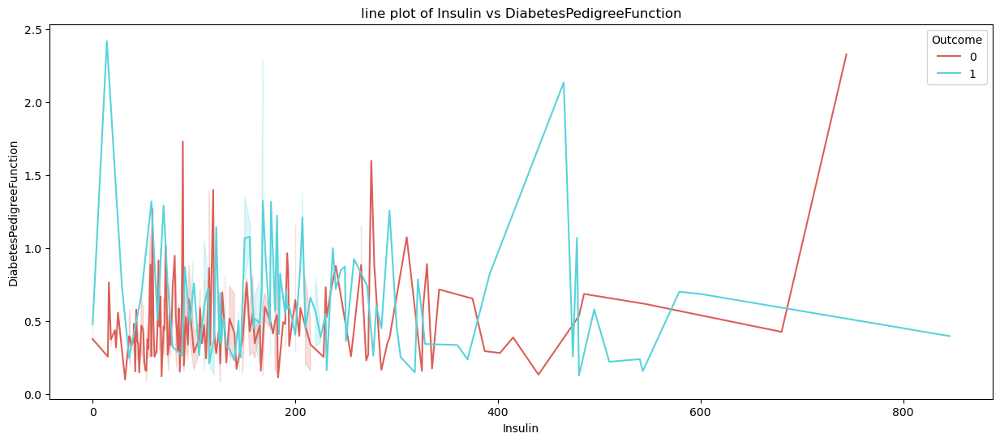

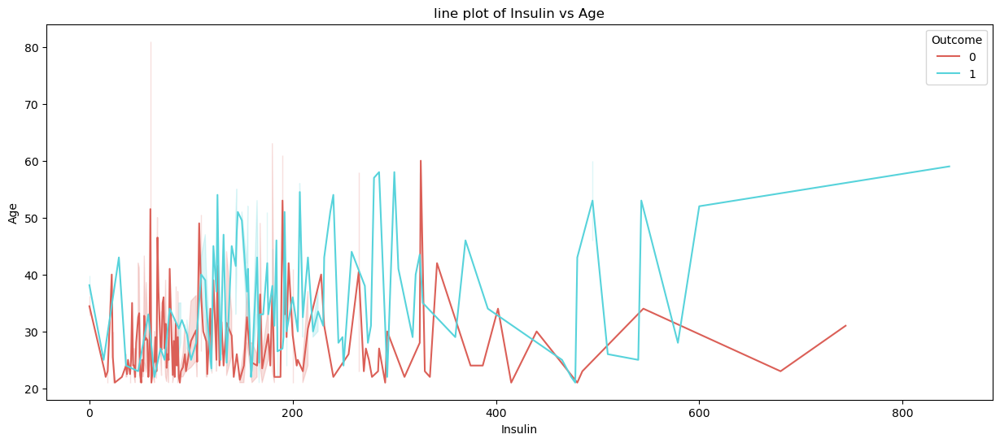

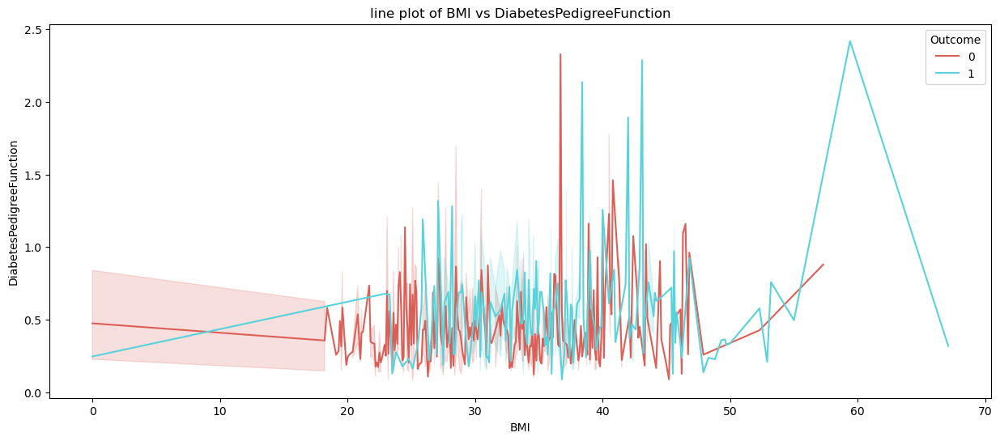

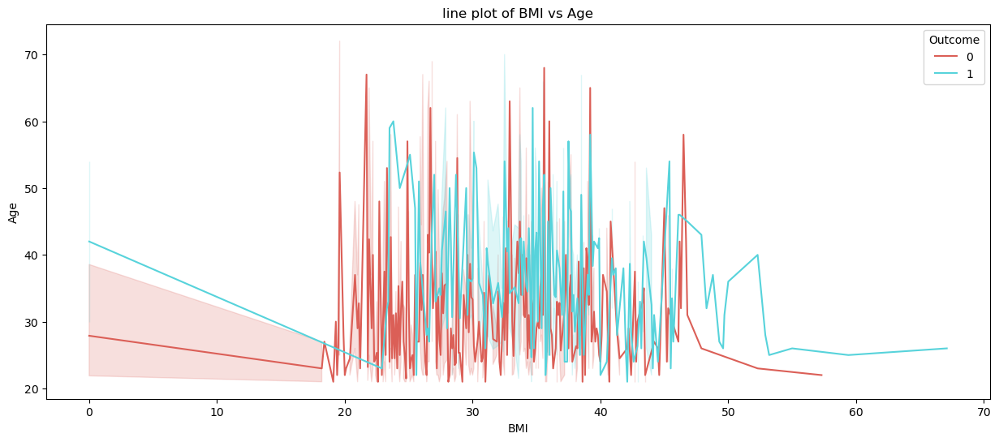

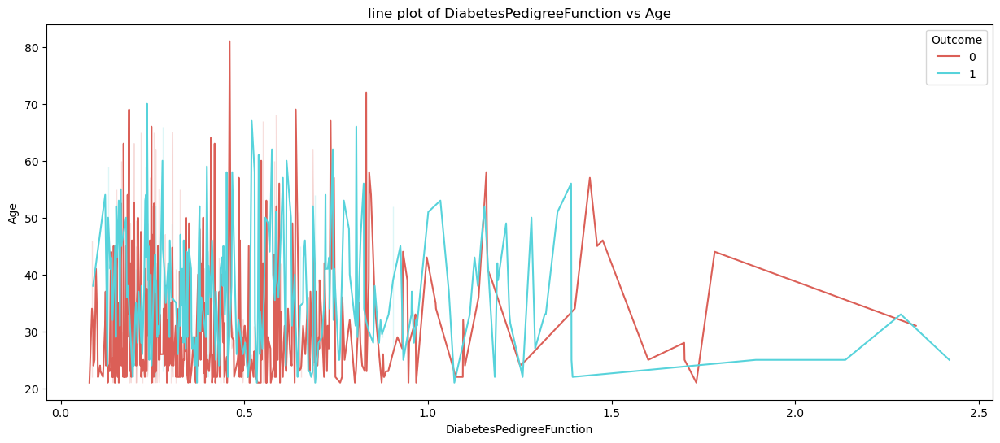

In [98]:
for i in range(len(continuous)):
 for j in range(i + 1, len(continuous)):
     plt.figure(figsize=(15, 6))
     sns.lineplot(x=continuous[i], y=continuous[j], data=df, hue= 'Outcome', palette='hls')
     plt.title(f'line plot of {continuous[i]} vs {continuous[j]}')
     plt.show()

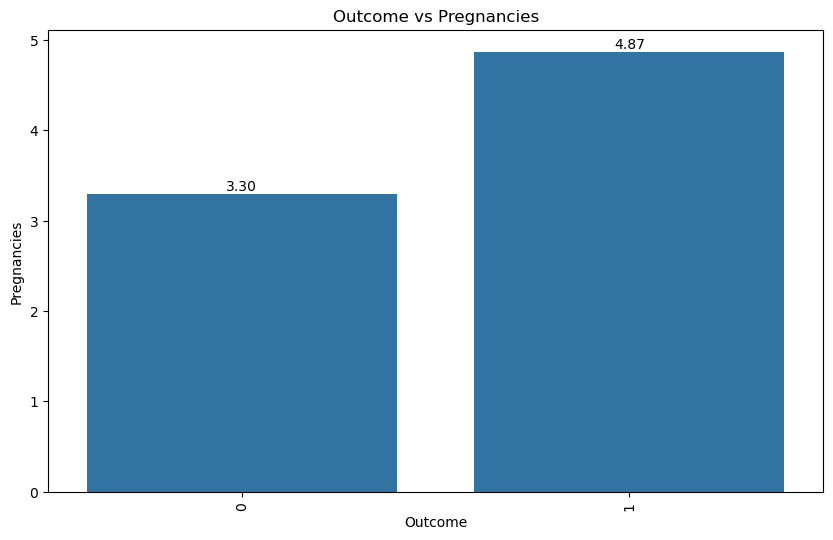

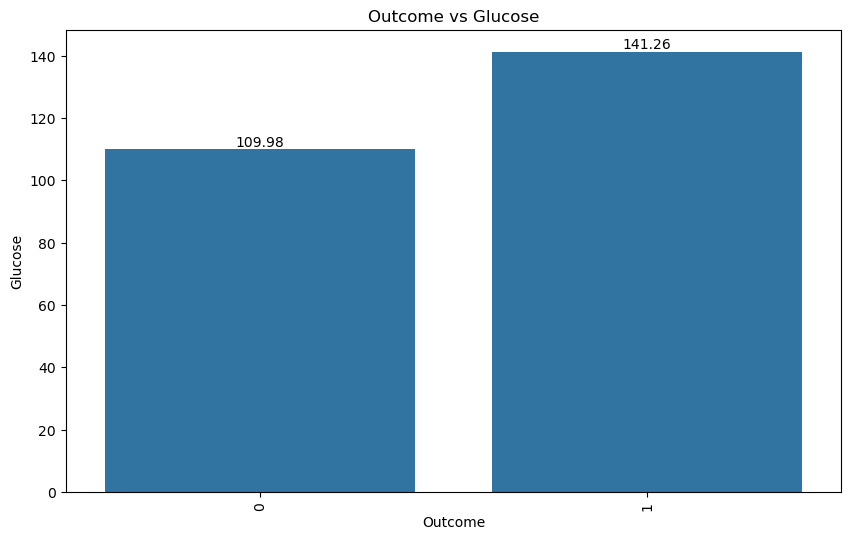

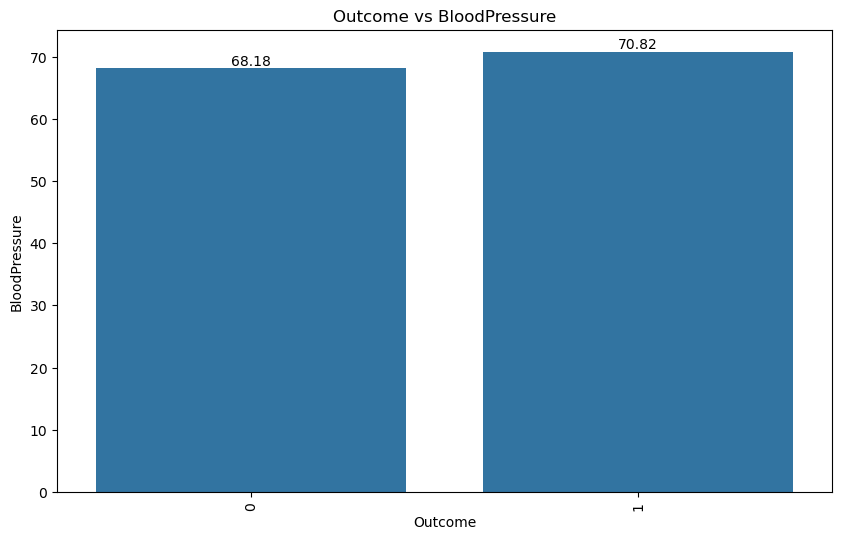

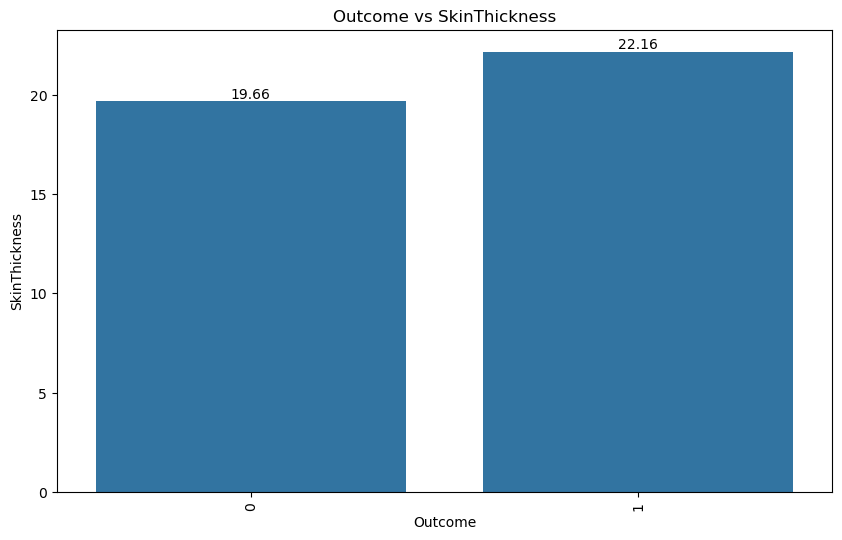

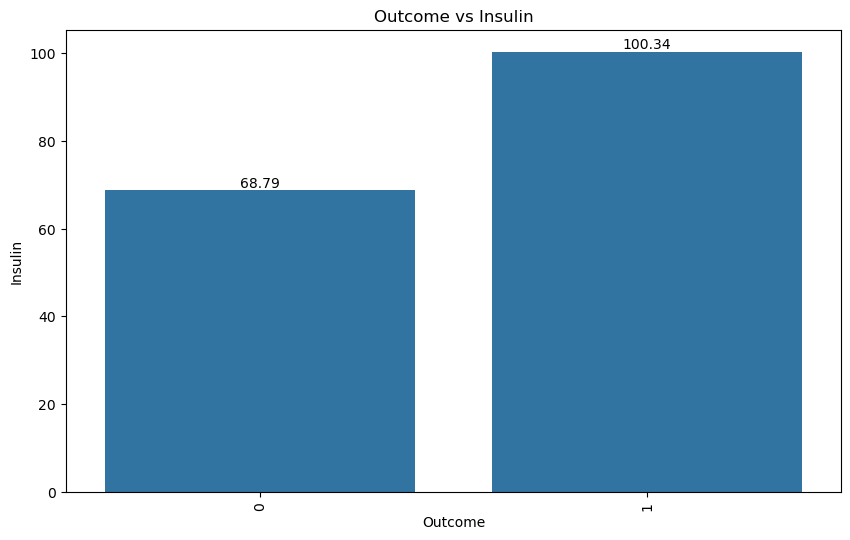

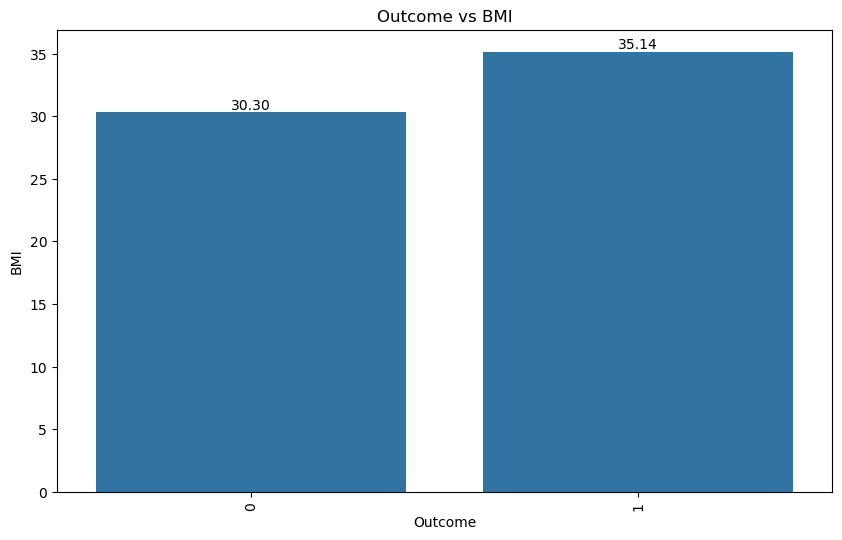

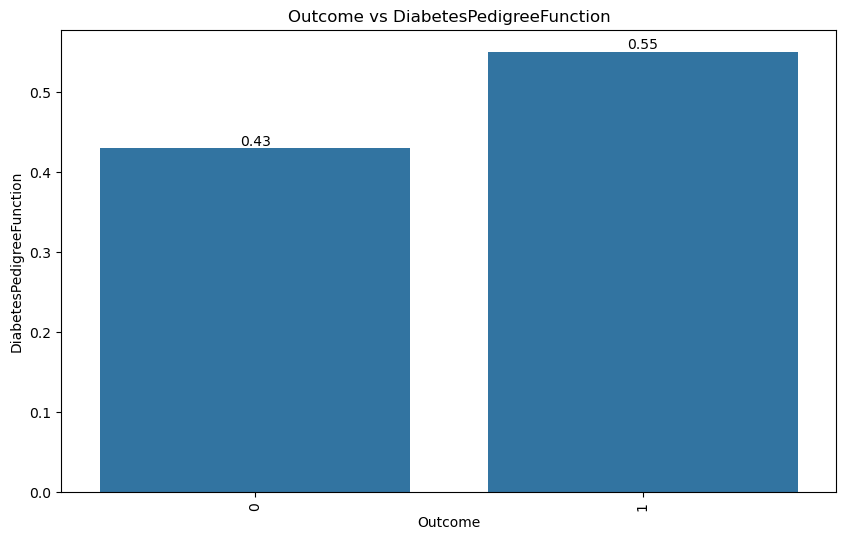

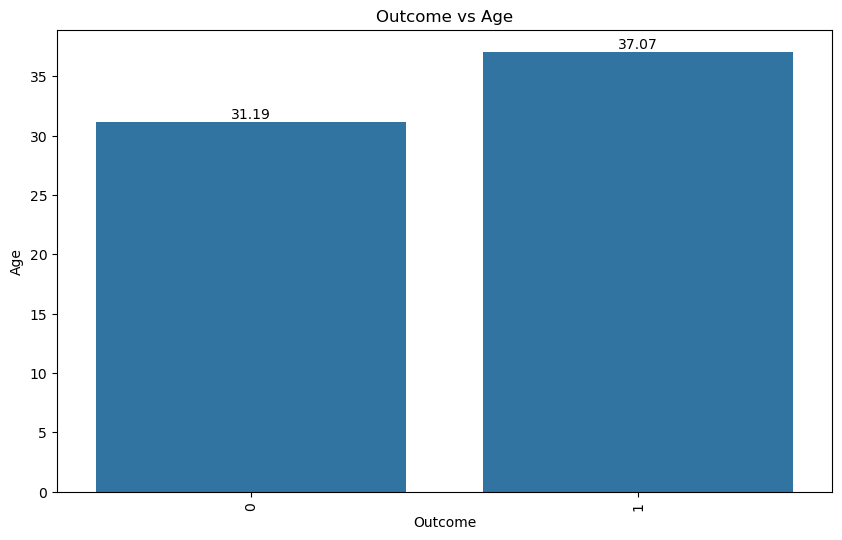

In [100]:
for dis in discrete:
 for cont in continuous:
     plt.figure(figsize=(10, 6))
     ax = sns.barplot(data=df, x=dis, y=cont, ci=None)
     plt.title(f'{dis} vs {cont}')

     for p in ax.patches:
         height = p.get_height()
         ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() /2., height),ha='center', va='bottom', fontsize=10,color='black', rotation=0)
     plt.xticks(rotation = 90)
     plt.show()

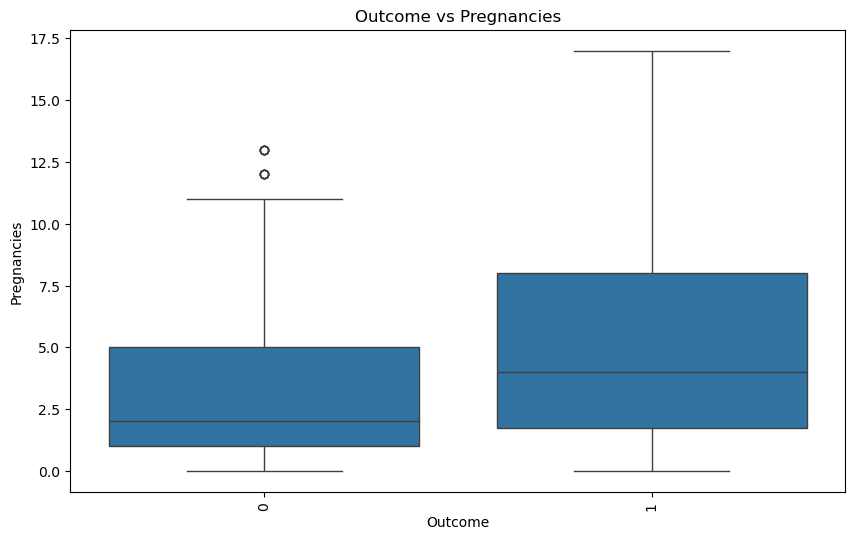

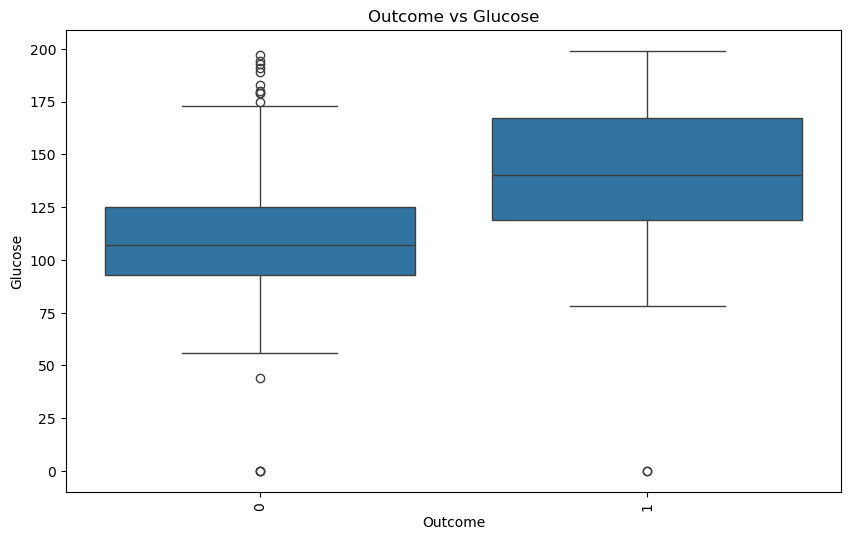

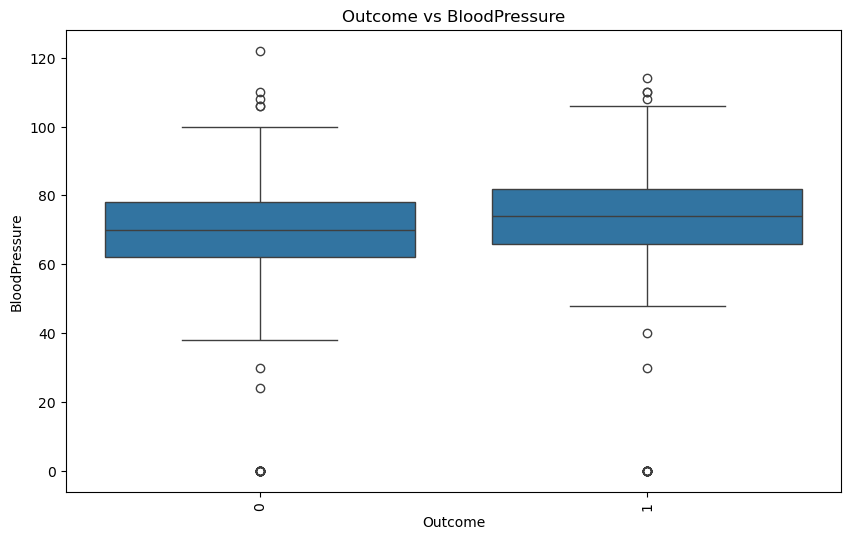

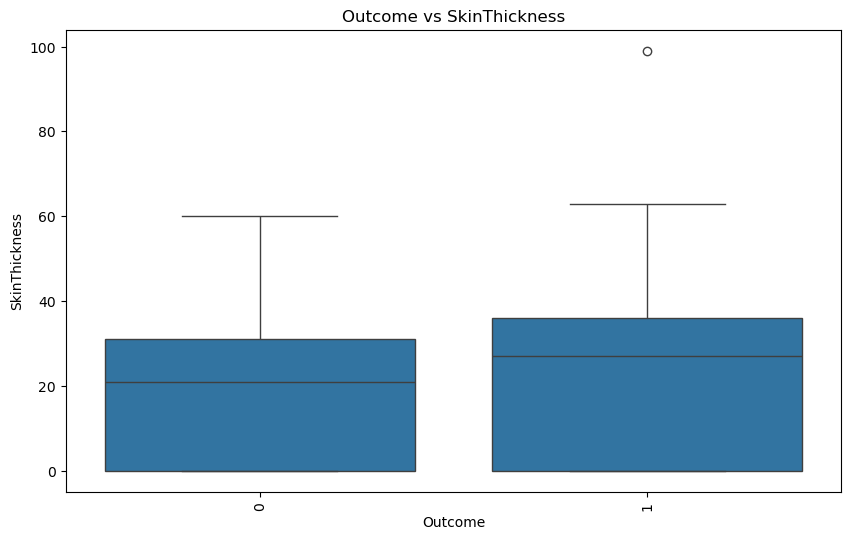

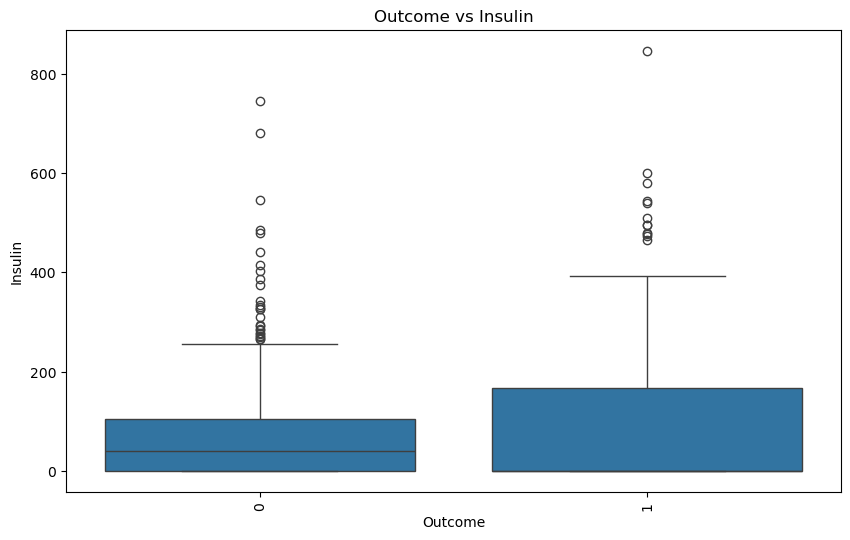

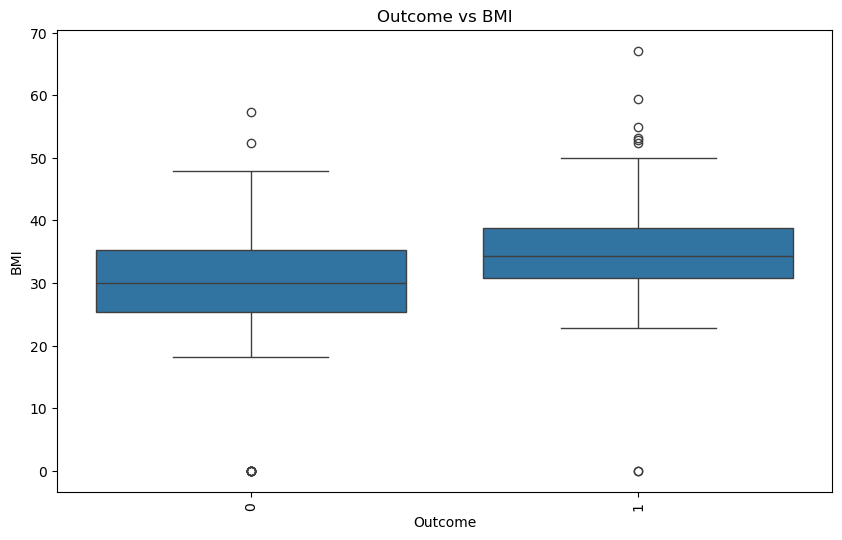

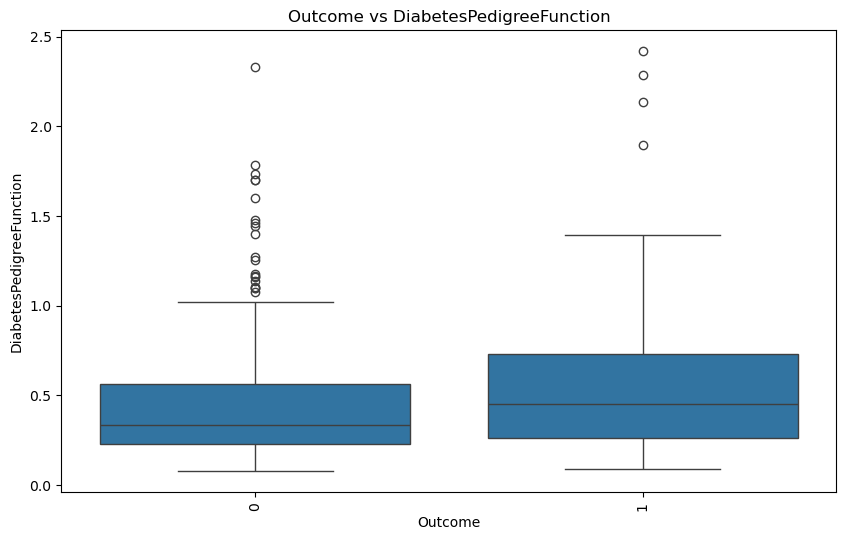

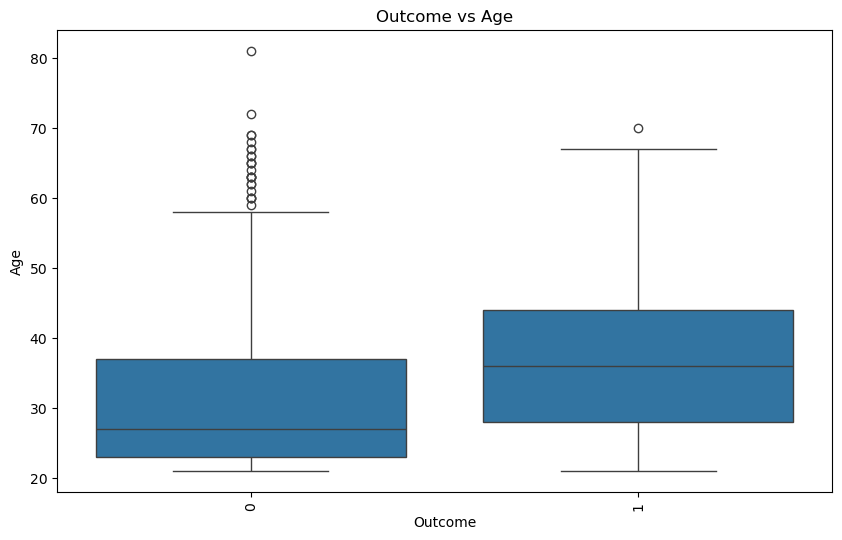

In [102]:
for dis in discrete:
 for cont in continuous:
     plt.figure(figsize=(10, 6))
     ax = sns.boxplot(data=df, x=dis, y=cont)
     plt.title(f'{dis} vs {cont}')
     plt.xticks(rotation = 90)
     plt.show()

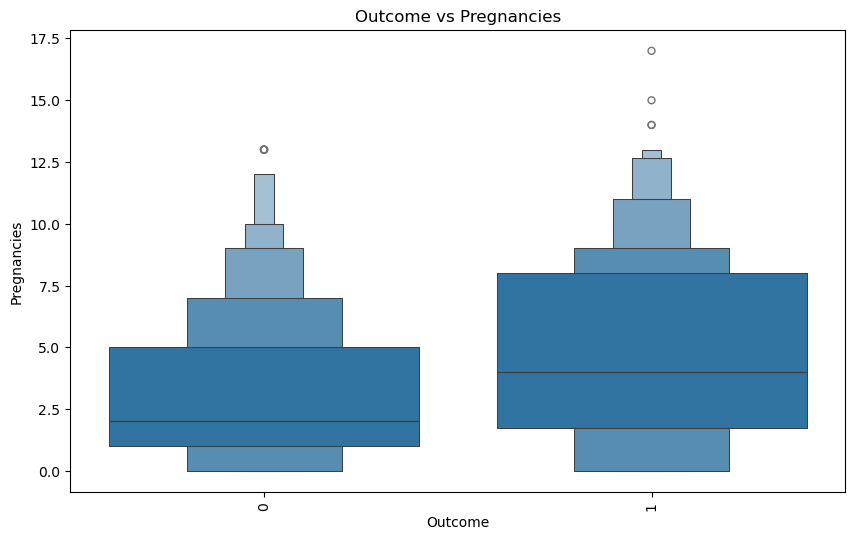

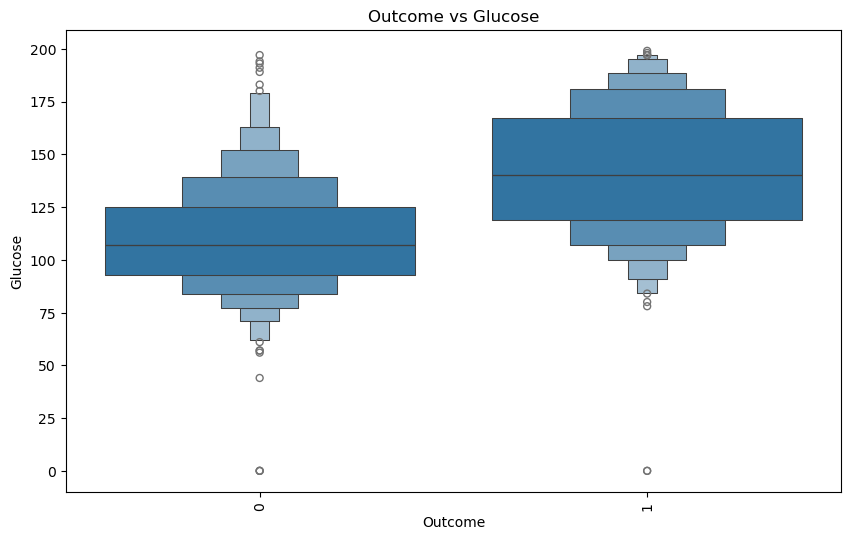

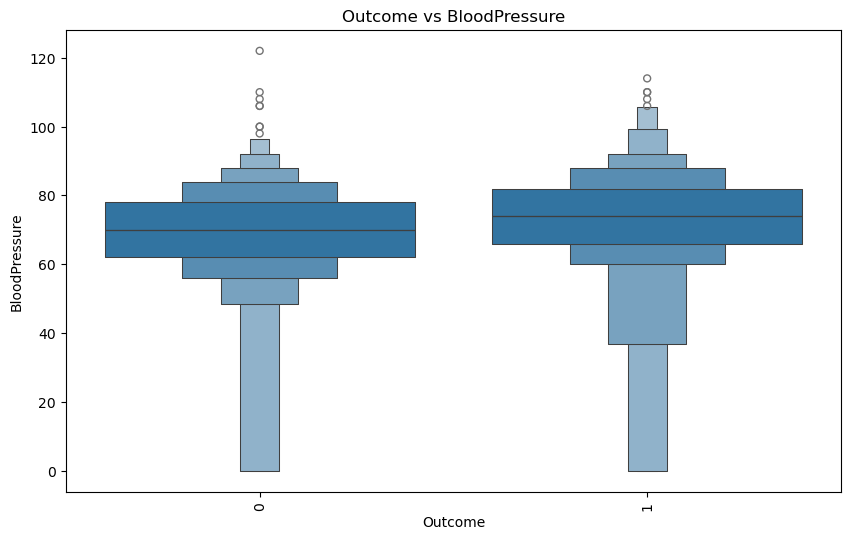

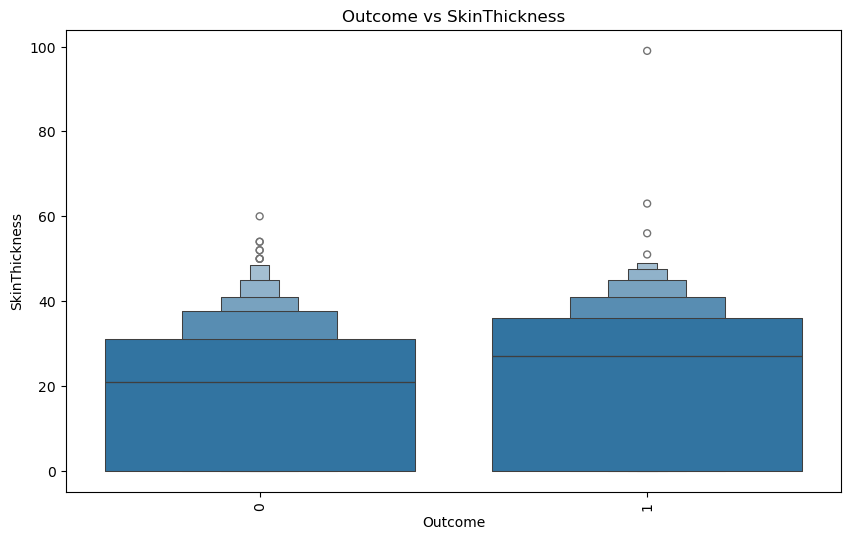

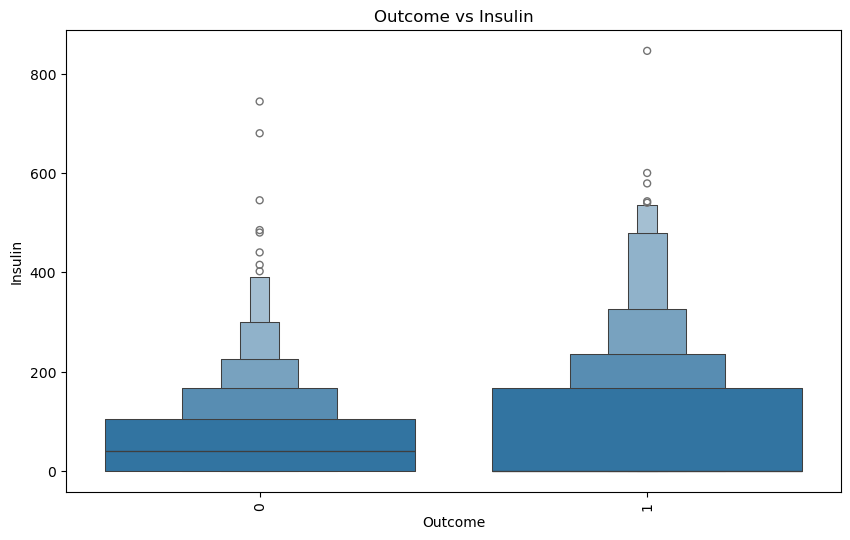

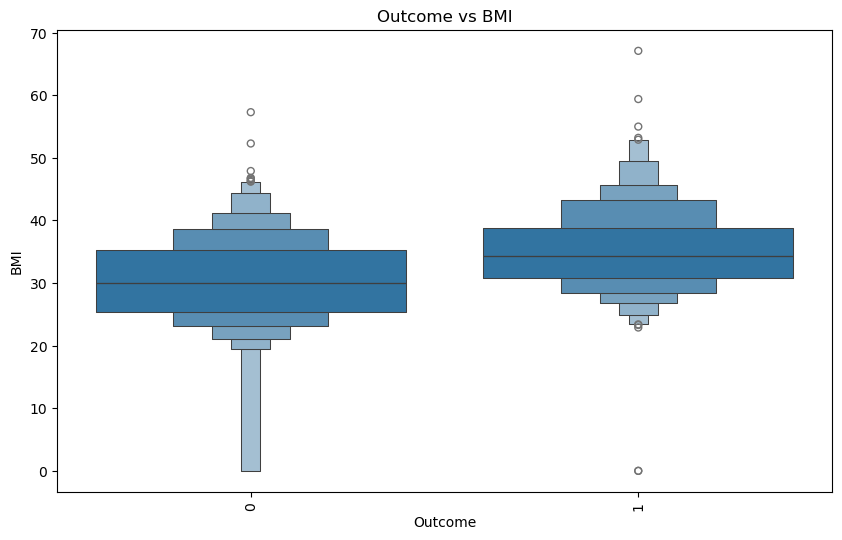

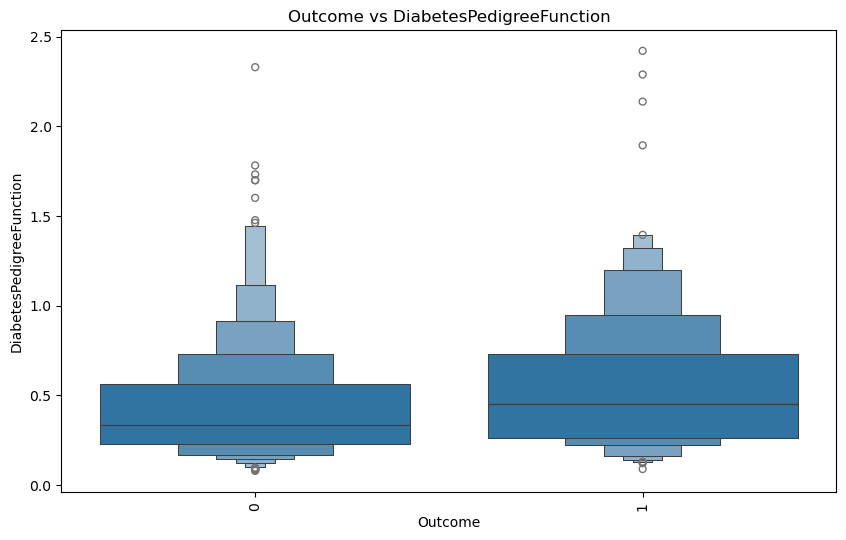

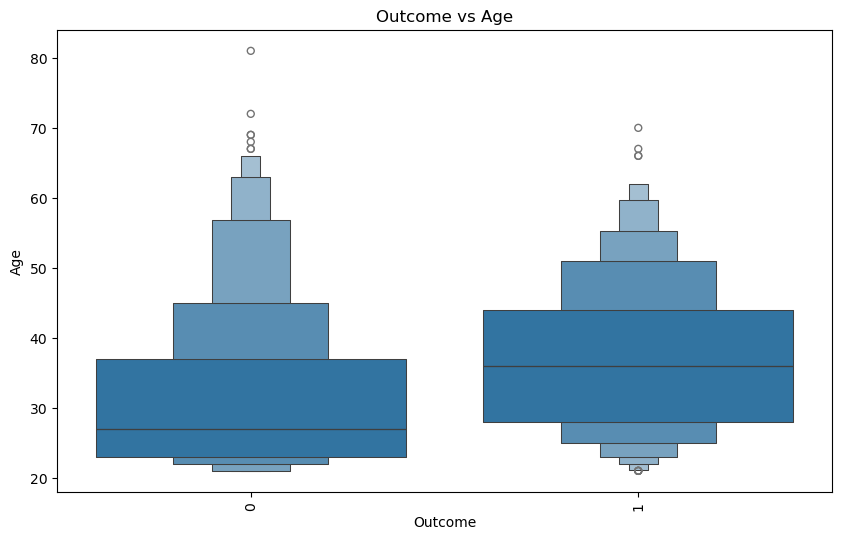

In [104]:
for dis in discrete:
 for cont in continuous:
     plt.figure(figsize=(10, 6))
     ax = sns.boxenplot(data=df, x=dis, y=cont)
     plt.title(f'{dis} vs {cont}')
     plt.xticks(rotation = 90)
     plt.show()

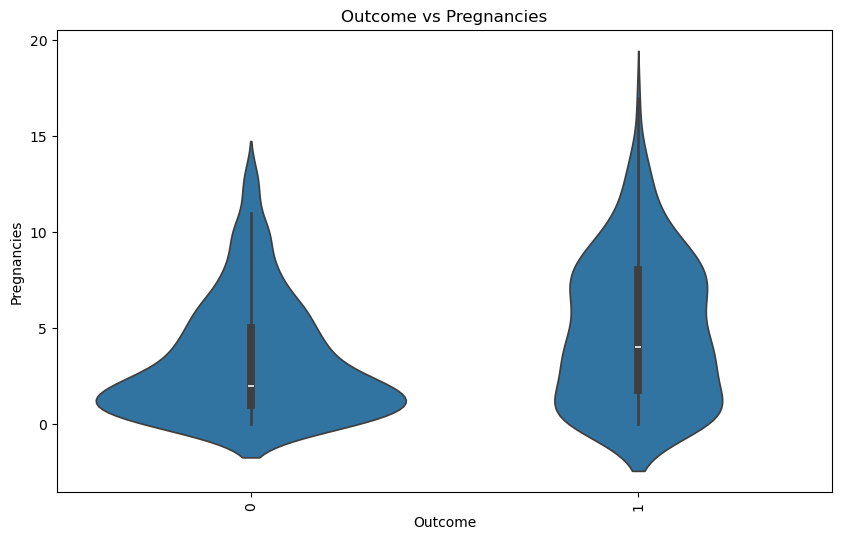

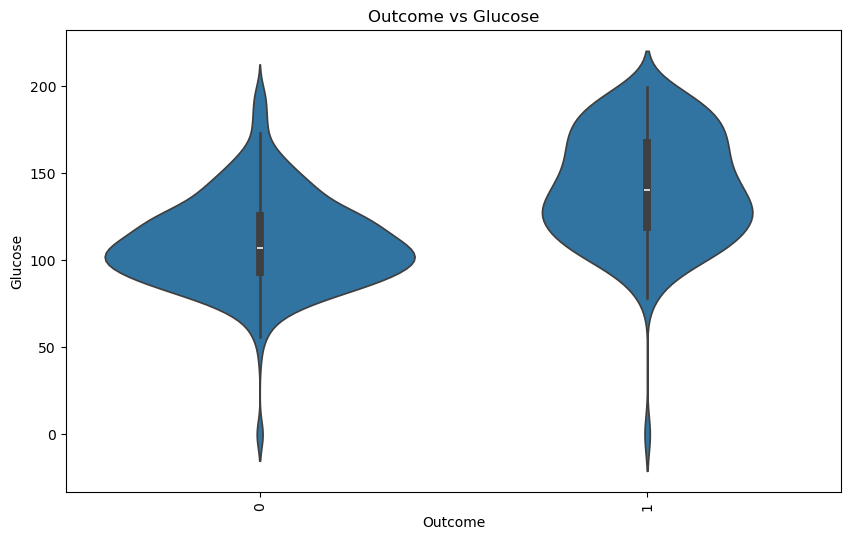

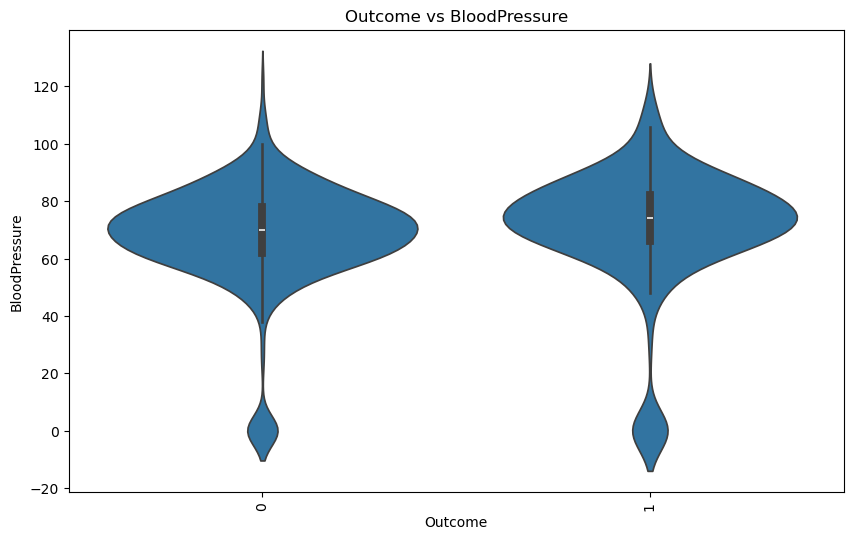

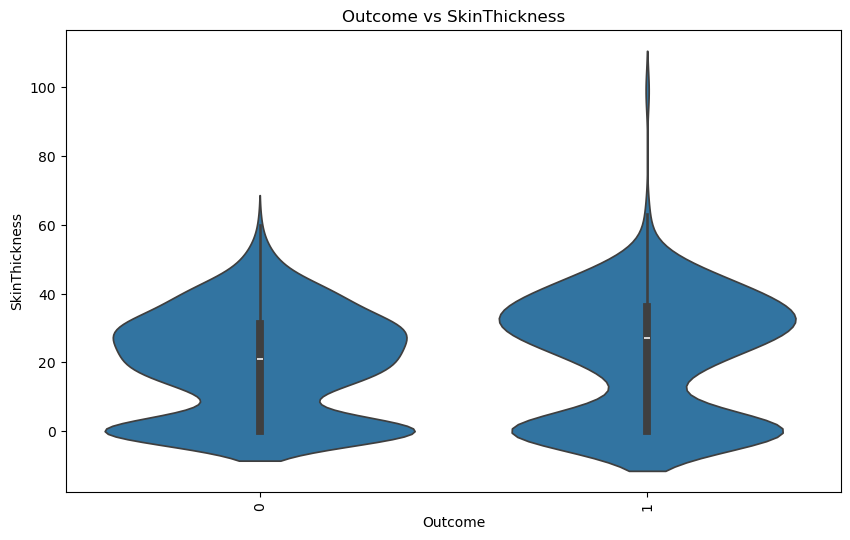

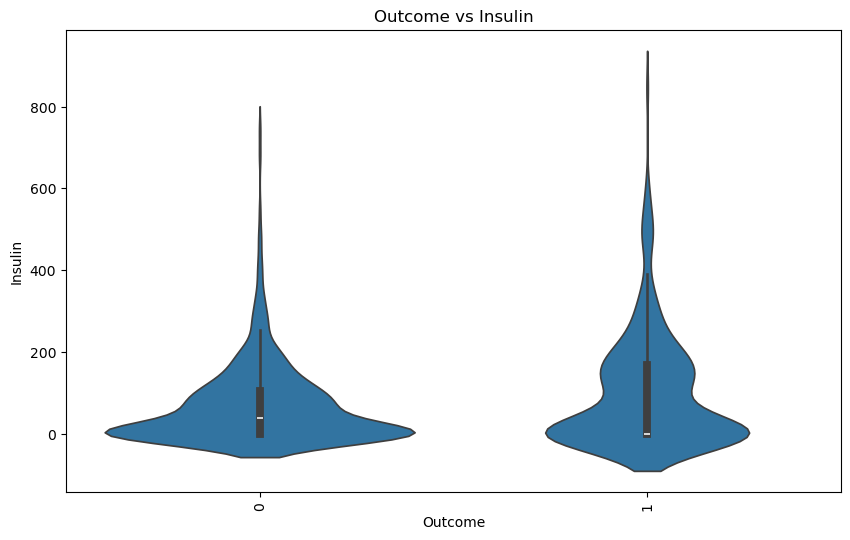

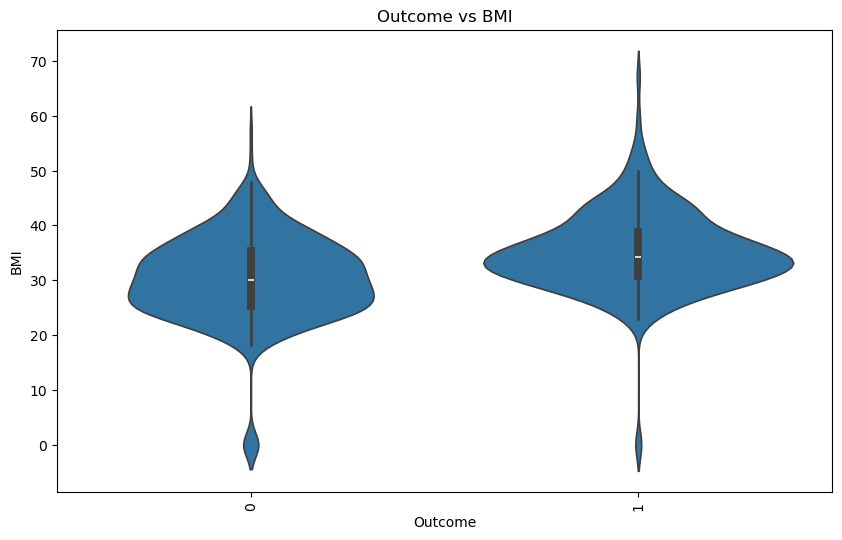

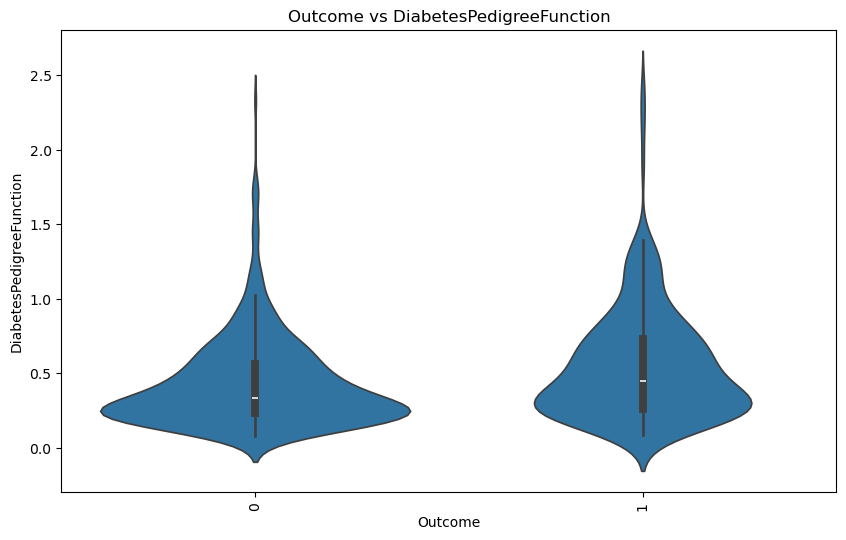

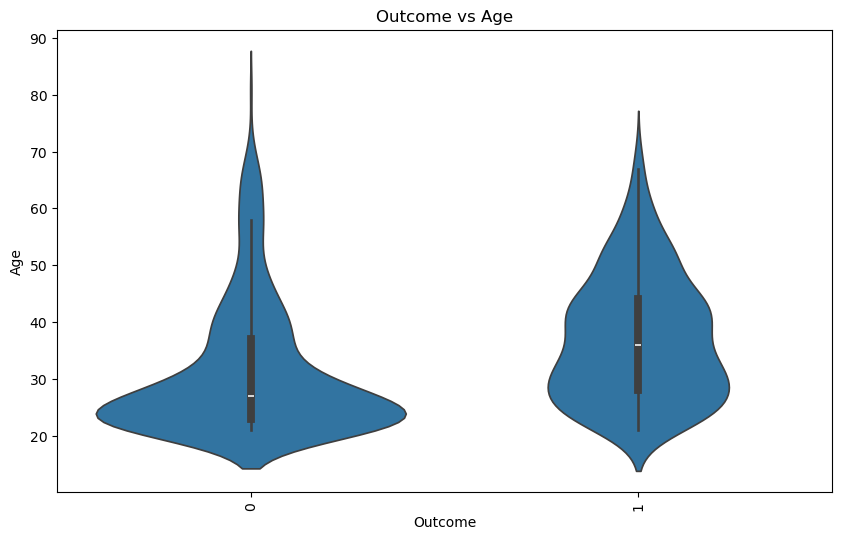

In [106]:
for dis in discrete:
 for cont in continuous:
     plt.figure(figsize=(10, 6))
     ax = sns.violinplot(data=df, x=dis, y=cont)
     plt.title(f'{dis} vs {cont}')
     plt.xticks(rotation = 90)
     plt.show()

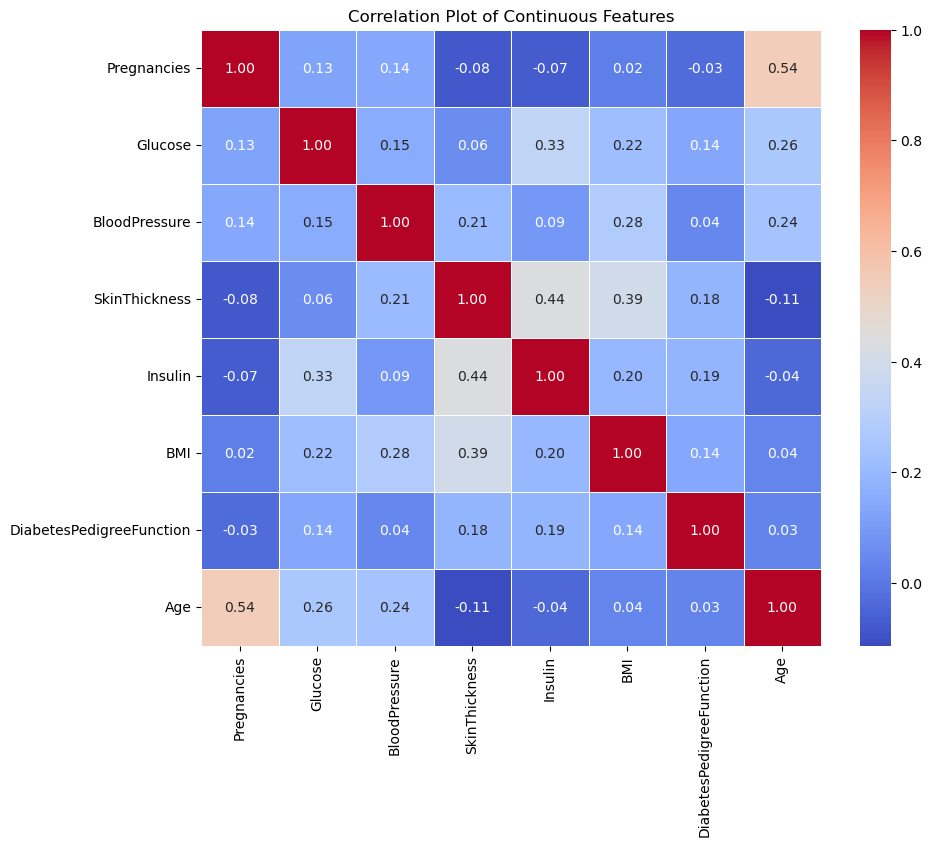

In [108]:
corr_matrix = df[continuous].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f",
linewidths=0.5)
plt.title('Correlation Plot of Continuous Features')
plt.show()

In [110]:
corr_matrix

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000


In [112]:
threshold = 0.7
features_to_drop = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            if colname not in features_to_drop:
                features_to_drop.append(colname)
features_to_drop

[]

In [116]:
def bmi_category(bmi):
 if bmi <= 18.5:
     return 'Underweight'
 elif 18.5 < bmi <= 24.9:
     return 'Healthy'
 elif 25 <= bmi <= 29.9:
     return 'Pre-obese'
 elif 30 <= bmi <= 34.9:
     return 'Obesity class 1'
 elif 35 <= bmi <= 39.9:
     return 'Obesity class 2'
 else:
     return 'Obesity class 3'
df['BMI_Category'] = df['BMI'].apply(bmi_category)
def insulin_category(insulin):
 if insulin < 25:
     return 'Fasting or 3+ hours after glucose ingestion'
 elif 30 <= insulin <= 230:
     return '30 minutes after glucose administration'
 elif 18 <= insulin <= 276:
     return '1 hour after glucose ingestion'
 elif 16 <= insulin <= 166:
     return '2 hours after glucose ingestion'
 else:
     return 'Other'
df['Insulin_Category'] = df['Insulin'].apply(insulin_category)
df


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BMI_Category,Insulin_Category
0,6,148,72,35,0,33.6,0.627,50,1,Obesity class 1,Fasting or 3+ hours after glucose ingestion
1,1,85,66,29,0,26.6,0.351,31,0,Pre-obese,Fasting or 3+ hours after glucose ingestion
2,8,183,64,0,0,23.3,0.672,32,1,Healthy,Fasting or 3+ hours after glucose ingestion
3,1,89,66,23,94,28.1,0.167,21,0,Pre-obese,30 minutes after glucose administration
4,0,137,40,35,168,43.1,2.288,33,1,Obesity class 3,30 minutes after glucose administration
...,...,...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0,Obesity class 1,30 minutes after glucose administration
764,2,122,70,27,0,36.8,0.340,27,0,Obesity class 2,Fasting or 3+ hours after glucose ingestion
765,5,121,72,23,112,26.2,0.245,30,0,Pre-obese,30 minutes after glucose administration
766,1,126,60,0,0,30.1,0.349,47,1,Obesity class 1,Fasting or 3+ hours after glucose ingestion


In [118]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object type columns:")
print(object_columns)


Object type columns:
Index(['BMI_Category', 'Insulin_Category'], dtype='object')


In [120]:
numerical_columns = df.select_dtypes(include=['int64',
'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)




Numerical type columns:
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


In [124]:
df['Outcome']

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [126]:
df_new = pd.get_dummies(df, columns=['BMI_Category',
'Insulin_Category'])

In [128]:
numerical_columns_1 = ['Pregnancies', 'Glucose', 'BloodPressure',
'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age']


In [130]:
pivot_table = pd.pivot_table(df_new, values='Glucose',
index='Outcome', aggfunc='mean')
pivot_table


,Glucose
Outcome,
0,109.980000
1,141.257463


In [132]:
pivot_table = pd.pivot_table(df_new, values=['Glucose',
'BloodPressure', 'Insulin','BMI', 'Age'], index=['Outcome'],
aggfunc=['mean', 'max'])
pivot_table

mean                                                  max        \
               Age        BMI BloodPressure     Glucose     Insulin Age   BMI   
Outcome                                                                         
0        31.190000  30.304200     68.184000  109.980000   68.792000  81  57.3   
1        37.067164  35.142537     70.824627  141.257463  100.335821  70  67.1   

                                       
        BloodPressure Glucose Insulin  
Outcome                                
0                 122     197     744  
1                 114     199     846

In [138]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_new[numerical_columns_1] = scaler.fit_transform(df_new[numerical_columns_1])
X = df_new.drop(['Outcome'], axis = 1)
y = df_new['Outcome']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify =
y, random_state= 42, test_size = 0.20)
from imblearn.over_sampling import SMOTE
sm = SMOTE()
X_train, y_train = sm.fit_resample(X_train, y_train)
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
LogisticRegression()
y_pred = model.predict(X_test)
from sklearn.metrics import accuracy_score, precision_score,recall_score, f1_score, confusion_matrix, classification_report
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.76
Precision: 0.63
Recall: 0.78
F1-score: 0.69


In [139]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[75 25]
 [12 42]]


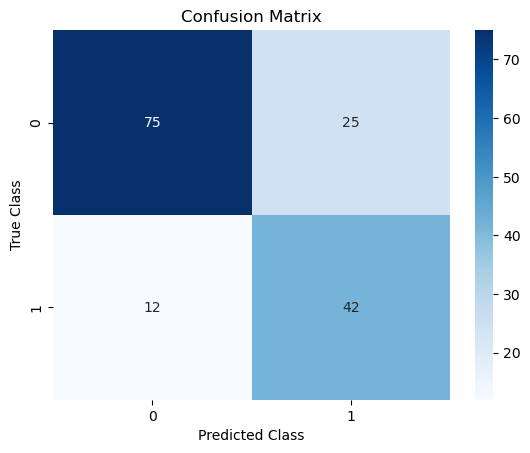

In [142]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()


In [144]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.86      0.75      0.80       100
           1       0.63      0.78      0.69        54

    accuracy                           0.76       154
   macro avg       0.74      0.76      0.75       154
weighted avg       0.78      0.76      0.76       154



In [146]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
DecisionTreeClassifier()
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))


Accuracy: 0.70
Precision: 0.58
Recall: 0.56
F1-score: 0.57


In [148]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[78 22]
 [24 30]]


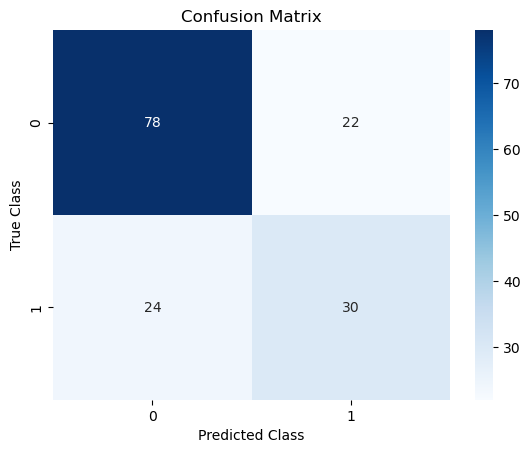

In [150]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [154]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.76      0.78      0.77       100
           1       0.58      0.56      0.57        54

    accuracy                           0.70       154
   macro avg       0.67      0.67      0.67       154
weighted avg       0.70      0.70      0.70       154



In [156]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)
RandomForestClassifier()
y_pred = rf.predict(X_test)

In [158]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.75
Precision: 0.65
Recall: 0.65
F1-score: 0.65


In [160]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


Confusion matrix:
[[81 19]
 [19 35]]


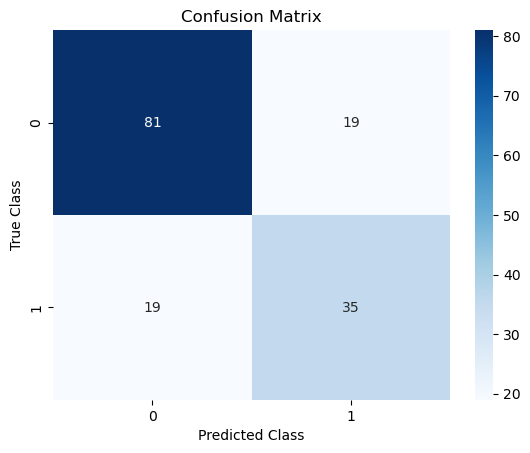

In [162]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [166]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.81      0.81      0.81       100
           1       0.65      0.65      0.65        54

    accuracy                           0.75       154
   macro avg       0.73      0.73      0.73       154
weighted avg       0.75      0.75      0.75       154



In [168]:
from sklearn.svm import SVC
sv = SVC(kernel='linear')
sv.fit(X_train, y_train)
SVC(kernel='linear')
y_pred = sv.predict(X_test)

In [170]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.76
Precision: 0.63
Recall: 0.74
F1-score: 0.68


In [172]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


Confusion matrix:
[[77 23]
 [14 40]]


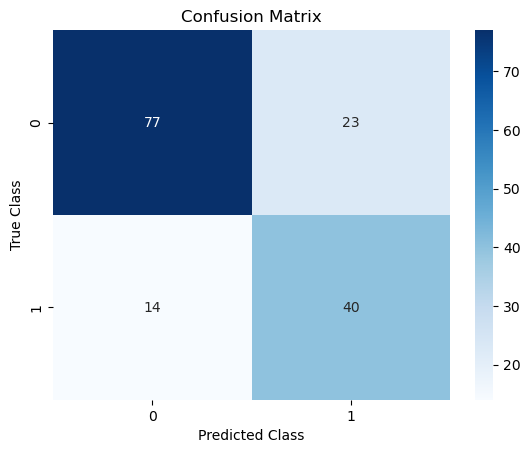

In [174]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [176]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.85      0.77      0.81       100
           1       0.63      0.74      0.68        54

    accuracy                           0.76       154
   macro avg       0.74      0.76      0.75       154
weighted avg       0.77      0.76      0.76       154



In [178]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)
GradientBoostingClassifier()
y_pred = gbc.predict(X_test)

In [180]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))

Accuracy: 0.75
Precision: 0.62
Recall: 0.74
F1-score: 0.67


In [182]:
import pickle

In [186]:
model_filename = 'svm_model_diabetes.pkl'
with open(model_filename, 'wb') as file:
 pickle.dump(sv, file)
print(f"Model saved to {model_filename}")
#Model saved to svm_model_diabetes.pkl

Model saved to svm_model_diabetes.pkl
